# Notebook for analyzing KcsA activation state (semi open 3f5b)
MD trajactory:  [data direcotry](../kcsa_3F5B/3F5B_WKWK_150mMK) 200ns using PDB 3F5B, E71 E118 E120 protonated, protein sequence H25 to R121  
MD parameters: OLPS4, POPC lipid with endogenous ligand POPG, 32 K+ (28 add in add ions ,4 with structture), 200 ns (sampling 200 ps, 1000 frames)    28 Cl-
Step 1. calculate torsion angle  
EX: python ../scripts/script_module/run_dihedral.py    289:384 /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/3F5B_KWKW_150mmK-out_centered-out.cms D  kcsa_activated_3f5b_D_torsion.csv  

In [1]:
#step2. processing torsion angle
import sys
import os
sys.path.append(os.path.expanduser("~/Dropbox/KcsA/scripts"))
from script_module import *

from torsion_analysis_module import TorsionAnalyzer2


    

/Users/yunyao_1/miniforge3/envs/KcsA_torsion/lib/python3.8/site-packages/MDAnalysis/analysis/data/filenames.py:110: DeprecationWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html
  from pkg_resources import resource_filename


In [3]:
chains = ['A', 'B', 'C', 'D']

for i, chain in zip(range(4),chains):
    print(f'python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/3F5B_KWKW_150mmK-out_centered-out.cms   {1+i*97}:{97+i*97} {chain}  kcsa_Activated_3f5b_{chain}_torsion.csv ')

python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/3F5B_KWKW_150mmK-out_centered-out.cms   1:97 A  kcsa_Activated_3f5b_A_torsion.csv 
python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/3F5B_KWKW_150mmK-out_centered-out.cms   98:194 B  kcsa_Activated_3f5b_B_torsion.csv 
python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/3F5B_KWKW_150mmK-out_centered-out.cms   195:291 C  kcsa_Activated_3f5b_C_torsion.csv 
python ../scripts/script_module/run_dihedral.py /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/3F5B_KWKW_150mmK-out_centered-out.cms   292:388 D  kcsa_Activated_3f5b_D_torsion.csv 


In [20]:
KcsA_analyzer = []

res_adjust_dict={'A':24, 'B':-73 , 'C':-170, 'D':-267}
# load data
for chain in ['A', 'B', 'C', 'D']:
    data_path = f'/Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/kcsa_Activated_3f5b_{chain}_torsion.csv'
    if os.path.exists(data_path):
        print(f"File {data_path} exists.")
        # Load the data
        KcsA_analyzer.append(TorsionAnalyzer2(data_path, adjusted_residue_index=True, res_adjust_dic=res_adjust_dict))
    else:
        print(f"File {data_path} does not exist.")

File /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/kcsa_Activated_3f5b_A_torsion.csv exists.
File /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/kcsa_Activated_3f5b_B_torsion.csv exists.
File /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/kcsa_Activated_3f5b_C_torsion.csv exists.
File /Users/yunyao_1/Dropbox/KcsA/kcsa_3F5B/3F5B_WKWK_150mMK/kcsa_Activated_3f5b_D_torsion.csv exists.


In [24]:
intra_correlation = KcsA_analyzer[3].calculate_intra_residue_correlation()
print("Intra-residue Correlations (φ(i) vs ψ(i)):")
for residue, correlation in intra_correlation.items():
    print(f"Residue {residue}: {correlation:.3f}")

Intra-residue Correlations (φ(i) vs ψ(i)):
Residue D:25: nan
Residue D:26: -0.398
Residue D:27: -0.484
Residue D:28: -0.413
Residue D:29: -0.442
Residue D:30: -0.505
Residue D:31: -0.479
Residue D:32: -0.391
Residue D:33: -0.333
Residue D:34: -0.498
Residue D:35: -0.365
Residue D:36: -0.421
Residue D:37: -0.564
Residue D:38: -0.446
Residue D:39: -0.505
Residue D:40: -0.435
Residue D:41: -0.344
Residue D:42: -0.409
Residue D:43: -0.525
Residue D:44: -0.433
Residue D:45: -0.183
Residue D:46: -0.515
Residue D:47: -0.335
Residue D:48: -0.516
Residue D:49: -0.367
Residue D:50: -0.417
Residue D:51: -0.486
Residue D:52: -0.168
Residue D:53: -0.031
Residue D:54: 0.414
Residue D:55: -0.070
Residue D:56: -0.267
Residue D:57: -0.155
Residue D:58: -0.401
Residue D:59: -0.148
Residue D:60: 0.049
Residue D:61: 0.042
Residue D:62: -0.498
Residue D:63: -0.535
Residue D:64: -0.480
Residue D:65: -0.437
Residue D:66: -0.368
Residue D:67: -0.277
Residue D:68: -0.474
Residue D:69: -0.511
Residue D:70: -0.4

In [25]:
KcsA_analyzer[0].data

,frame_index,time_ps,A:25-psi,A:25-phi,A:26-psi,A:26-phi,A:27-psi,A:27-phi,A:28-psi,A:28-phi,...,A:117-psi,A:117-phi,A:118-psi,A:118-phi,A:119-psi,A:119-phi,A:120-psi,A:120-phi,A:121-psi,A:121-phi
0,0,0.000,11.004937,NaN,-26.138711,-64.260463,-36.933979,-57.171362,-50.454117,-58.770567,...,-41.396971,-69.234736,-19.560330,-75.100163,-33.693456,-84.307418,-46.544580,-59.921632,NaN,-94.260070
1,1,199.998,122.936530,NaN,-28.183541,-62.952915,-29.068246,-49.253960,-40.454011,-74.072504,...,-28.038840,-58.374879,-16.651653,-72.492896,-28.072747,-81.203983,-36.119654,-93.849687,NaN,-127.029855
2,2,399.996,113.210617,NaN,-19.663012,-57.100388,-38.023026,-53.400686,-35.438092,-74.893555,...,-61.017884,-35.355474,-39.470662,-55.085068,-46.838755,-74.739025,-41.285622,-60.967643,NaN,-149.511383
3,3,599.994,126.276152,NaN,-2.391723,-72.995281,-35.315687,-53.717245,-51.877596,-75.716592,...,-35.847563,-72.352461,-44.013531,-64.480748,-40.452381,-68.581913,-30.295343,-75.641901,NaN,-142.394540
4,4,799.992,116.473428,NaN,-18.997960,-52.926901,-39.550613,-51.348989,-23.064873,-75.539041,...,-33.752117,-65.510783,-41.146352,-70.364372,-34.574918,-71.008144,-44.892005,-86.189355,NaN,-144.750571
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
997,997,199398.006,106.969765,NaN,-38.991483,-77.071686,-28.454468,-68.574911,-50.003665,-56.380362,...,-17.247120,-84.006423,-34.262263,-72.407230,-8.313239,-71.472223,125.006625,-98.091940,NaN,-126.046898
998,998,199598.004,87.449104,NaN,-25.051054,-61.406692,-36.120611,-87.812969,-43.697283,-60.581517,...,-15.212451,-63.913748,-34.853760,-87.522056,1.581443,-81.584995,72.160748,-75.158873,NaN,-62.222294
999,999,199798.002,51.004998,NaN,-40.934825,-67.588152,-49.388686,-53.039645,-54.922452,-58.716279,...,-20.683328,-71.050014,-2.856987,-80.783915,-17.028756,-105.223038,139.742876,-62.952366,NaN,-145.850740
1000,1000,199998.000,42.748664,NaN,-34.776864,-60.566648,-39.005696,-76.503777,-38.448504,-59.577113,...,-30.145225,-63.351475,-30.900819,-69.856503,-14.825372,-89.657474,123.798181,-62.521826,NaN,-136.230698


In [5]:
#calculate inter-residue correlation
inter_correlation = KcsA_analyzer[0].calculate_inter_residue_correlation()
print("Inter-residue Correlations (φ(i+1) vs ψ(i)):")
for residue, correlation in inter_correlation.items():
    print(f"Residue {residue}: {correlation:.3f}")

Inter-residue Correlations (φ(i+1) vs ψ(i)):
Residue A:26: -0.248
Residue A:27: 0.098
Residue A:28: -0.003
Residue A:29: -0.728
Residue A:30: 0.309
Residue A:31: -0.029
Residue A:32: -0.206
Residue A:33: -0.350
Residue A:34: -0.471
Residue A:35: -0.414
Residue A:36: -0.549
Residue A:37: -0.487
Residue A:38: -0.394
Residue A:39: -0.508
Residue A:40: -0.578
Residue A:41: -0.433
Residue A:42: -0.475
Residue A:43: -0.540
Residue A:44: -0.527
Residue A:45: -0.470
Residue A:46: -0.509
Residue A:47: -0.502
Residue A:48: -0.615
Residue A:49: -0.670
Residue A:50: -0.506
Residue A:51: -0.521
Residue A:52: 0.656
Residue A:53: -0.537
Residue A:54: -0.284
Residue A:55: 0.809
Residue A:56: -0.392
Residue A:57: -0.593
Residue A:58: -0.513
Residue A:59: -0.679
Residue A:60: -0.616
Residue A:61: -0.562
Residue A:62: -0.387
Residue A:63: -0.572
Residue A:64: -0.496
Residue A:65: -0.556
Residue A:66: -0.548
Residue A:67: -0.565
Residue A:68: -0.541
Residue A:69: -0.622
Residue A:70: -0.575
Residue A:71: 

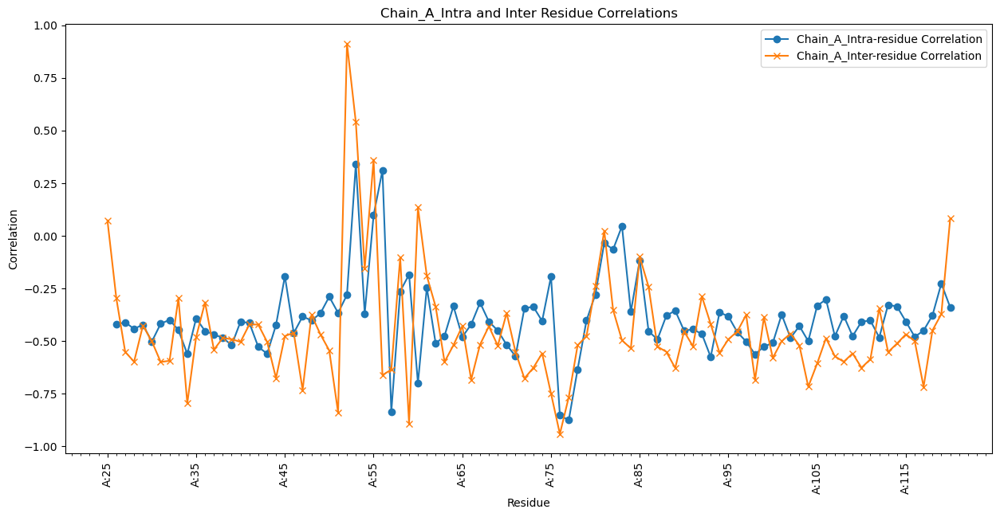

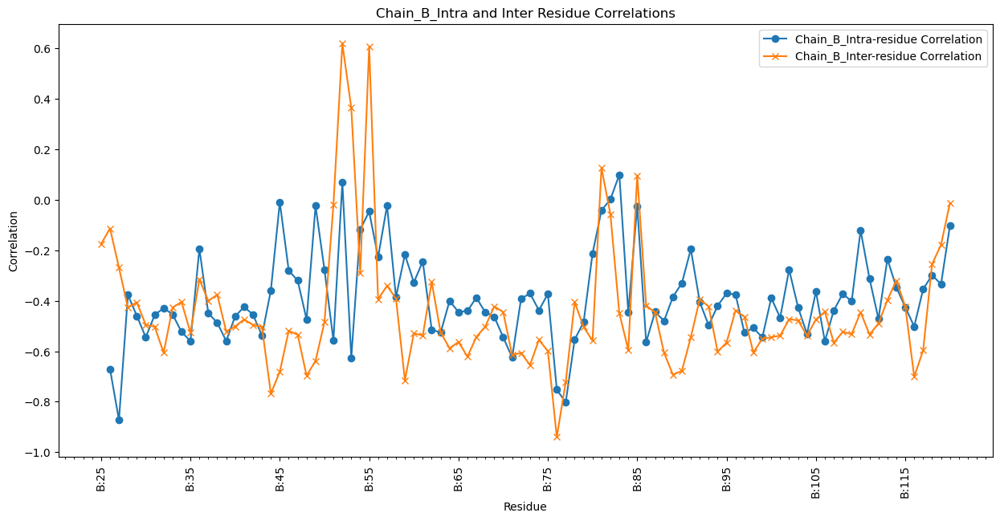

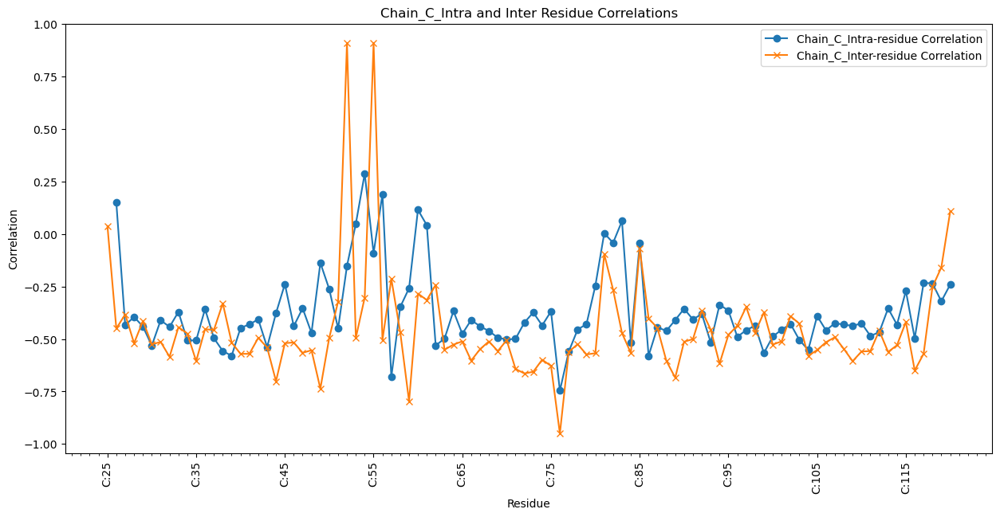

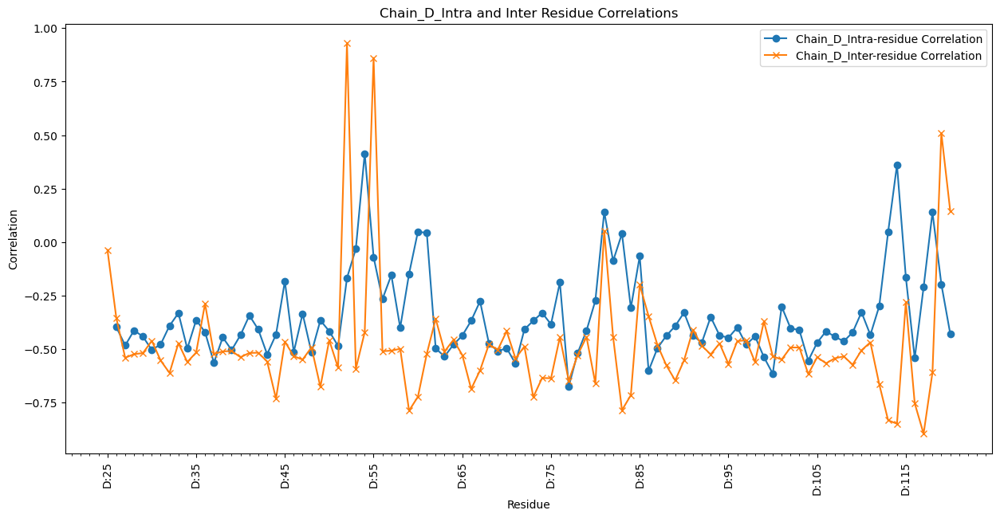

In [26]:
#plot the correlation
import matplotlib.pyplot as plt
from matplotlib.ticker import MultipleLocator
for chain, i in zip(['A', 'B', 'C', 'D'], range(4)):

    inter_correlation = KcsA_analyzer[i].calculate_inter_residue_correlation()
    intra_correlation = KcsA_analyzer[i].calculate_intra_residue_correlation()
    # Extract residues and their corresponding correlations
    residues = list(intra_correlation.keys())
    intra_values = list(intra_correlation.values())
    inter_values = list(inter_correlation.values())

    # Create a figure and axis
    fig, ax = plt.subplots(figsize=(15, 7))

    # Plot intra-residue correlations
    ax.plot(residues, intra_values, label=f'Chain_{chain}_Intra-residue Correlation', marker='o')

    # Plot inter-residue correlations
    ax.plot(residues[:-1], inter_values, label=f'Chain_{chain}_Inter-residue Correlation', marker='x')


    # Set labels and title
    ax.set_xlabel('Residue')
    ax.set_ylabel('Correlation')
    ax.set_title(f'Chain_{chain}_Intra and Inter Residue Correlations')
    ax.legend()

    # Set up major and minor tickers
    major_locator = MultipleLocator(10)  # Adjust to the desired spacing of major ticks
    minor_locator = MultipleLocator(1)   # Adjust to the desired spacing of minor ticks

    ax.xaxis.set_major_locator(major_locator)
    ax.xaxis.set_minor_locator(minor_locator)

    # Rotate x-axis labels for better readability and only show for major ticks
    ax.tick_params(axis='x', which='major', labelrotation=90)
    ax.tick_params(axis='x', which='minor', labelbottom=False)

    # Rotate x-axis labels for better readability
    plt.xticks(rotation=90)
    plt.savefig(f'intra_inter_residue_correlation_chain_{chain}.png', dpi=300, bbox_inches='tight')
    plt.show()

/Users/yunyao_1/miniforge3/envs/KcsA_torsion/lib/python3.8/site-packages/MDAnalysis/analysis/base.py:438: UserWarning: Reader has no dt information, set to 1.0 ps
  self.times[i] = ts.time


Combined plot saved as KcsA_Rama_plots_chainA/Combined_Ramachandran_1k4c.png


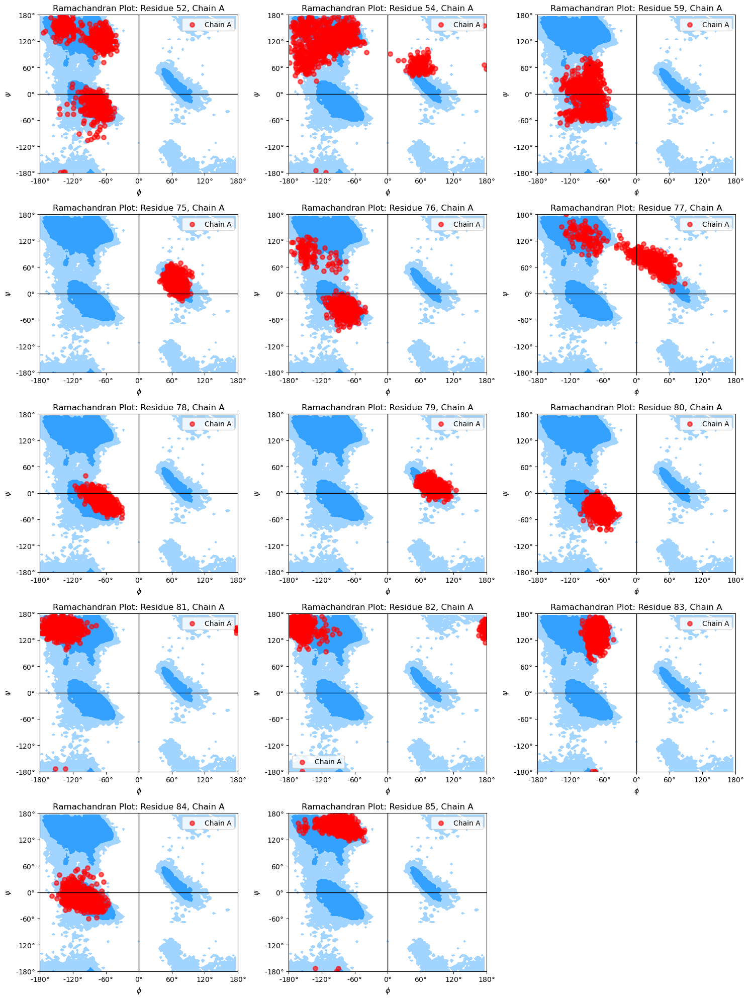

Combined plot saved as KcsA_Rama_plots_chainB/Combined_Ramachandran_1k4c.png


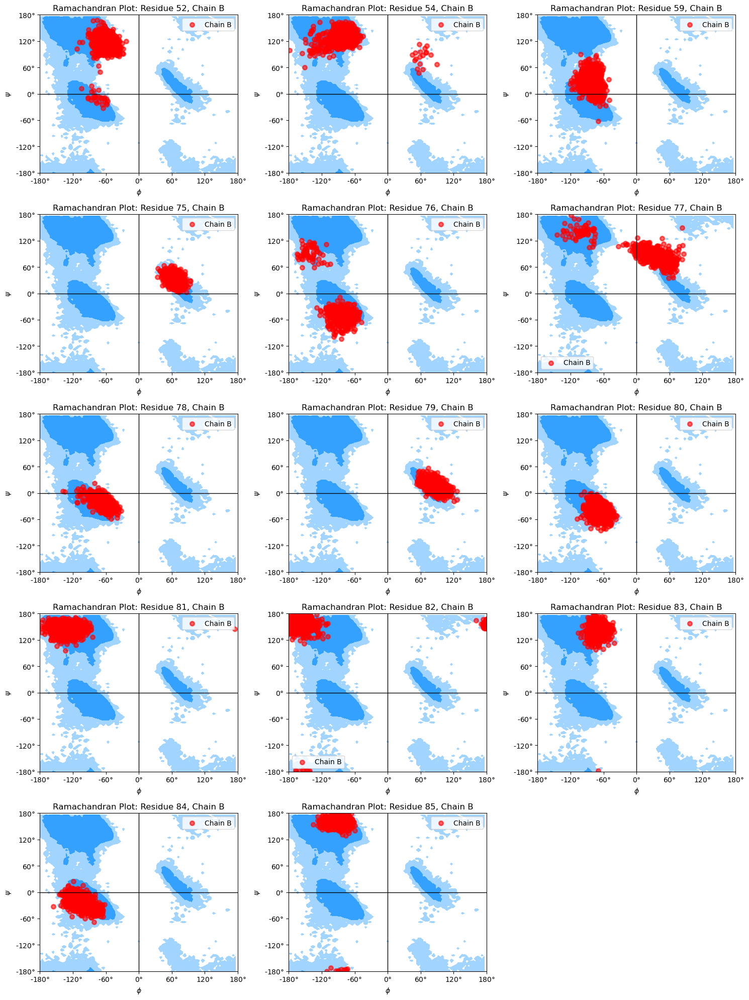

Combined plot saved as KcsA_Rama_plots_chainC/Combined_Ramachandran_1k4c.png


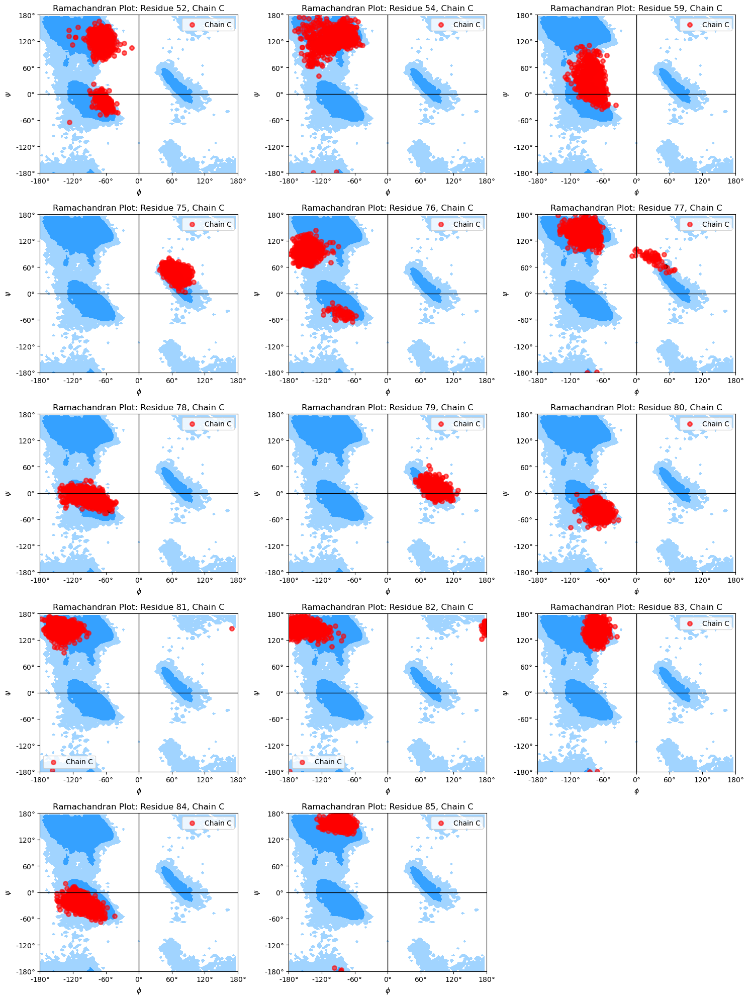

Combined plot saved as KcsA_Rama_plots_chainD/Combined_Ramachandran_1k4c.png


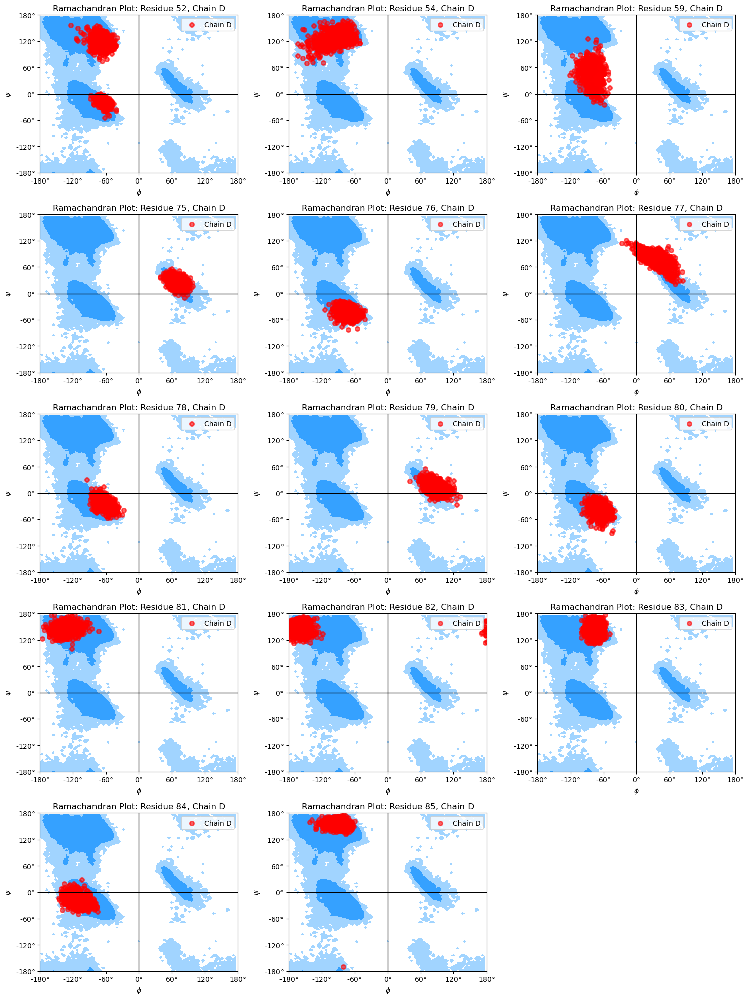

In [27]:
# plot residue torsion angles over Ramachandran plot
residues_to_plot=[52, 54, 59, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85]
#chains=['A']
#DHFR_analyzer.plot_ramachandran(residue_index='23', PDB_code='1rx1', chain='A', output_dir='DHFR_Rama_plots2') 
for chain, i in zip(['A', 'B', 'C', 'D'], range(4)):
#for chain, i in zip(['D'], [3]):
    KcsA_analyzer[i].plot_all_ramachandran(residue_indices=residues_to_plot, PDB_code='1k4c', PDB_chain='C', chains=[chain], output_dir=f'KcsA_Rama_plots_chain{chain}')

Combined plot saved as KcsA_scatter_plots_ChainA/inter_intra_torsion_scatter_52.png


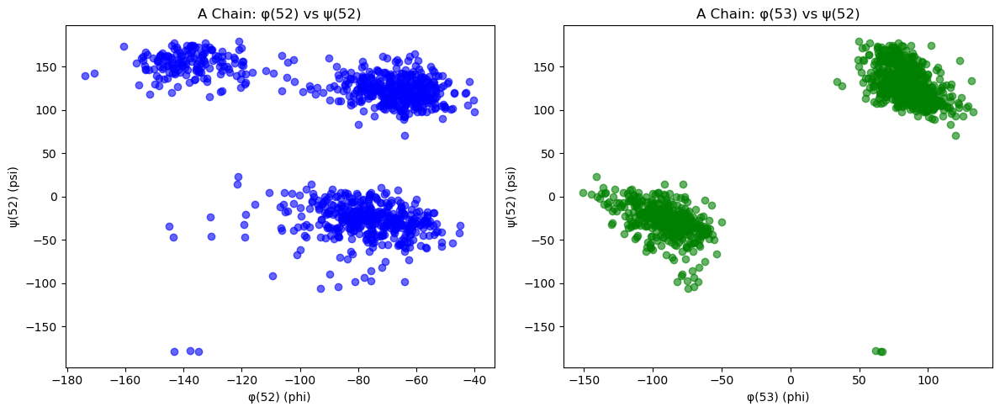

In [28]:
residues_to_plot=[52]
for residue in residues_to_plot:
    KcsA_analyzer[0].plot_scatter(residue, chains='A', output_dir='KcsA_scatter_plots_ChainA')

Combined plot saved as KcssA_scatter_plots_ChainB/inter_intra_torsion_scatter_52.png


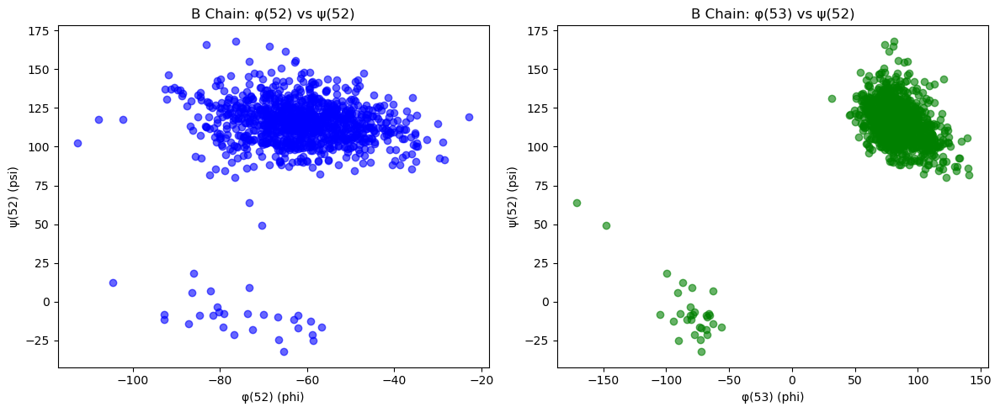

Combined plot saved as KcssA_scatter_plots_ChainB/inter_intra_torsion_scatter_79.png


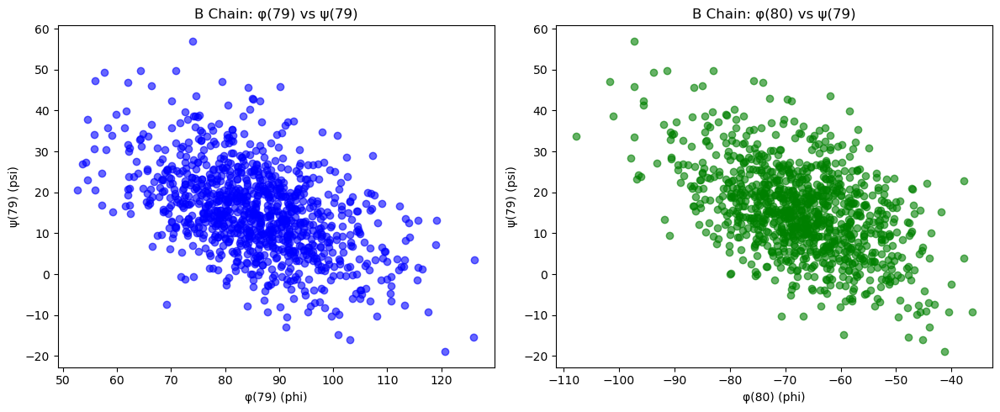

Combined plot saved as KcssA_scatter_plots_ChainB/inter_intra_torsion_scatter_80.png


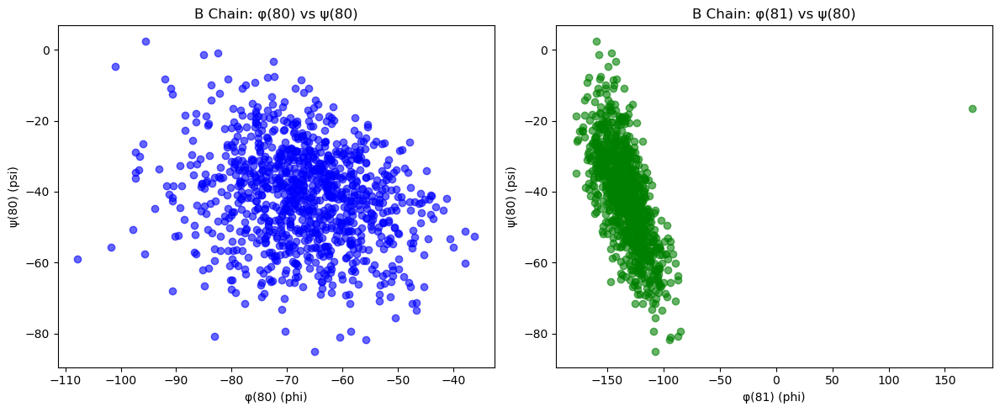

In [29]:
residues_to_plot=[52, 79, 80]
for residue in residues_to_plot:
    KcsA_analyzer[1].plot_scatter(residue, chains='B', output_dir='KcssA_scatter_plots_ChainB')

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_52.png


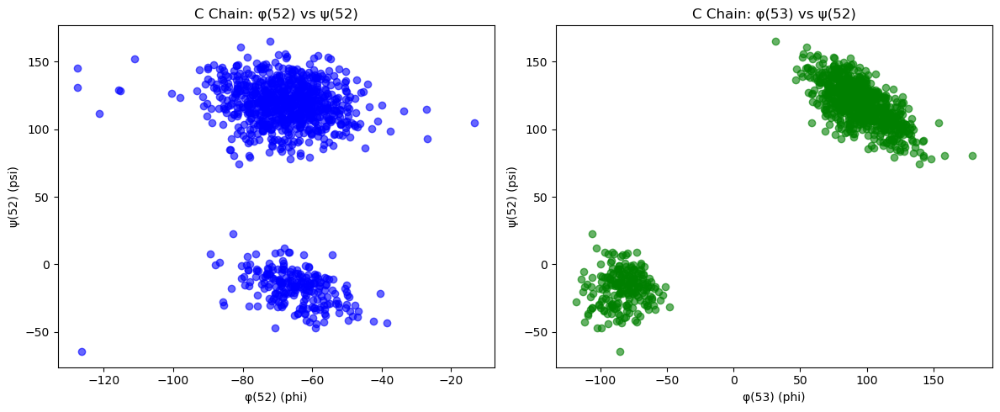

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_77.png


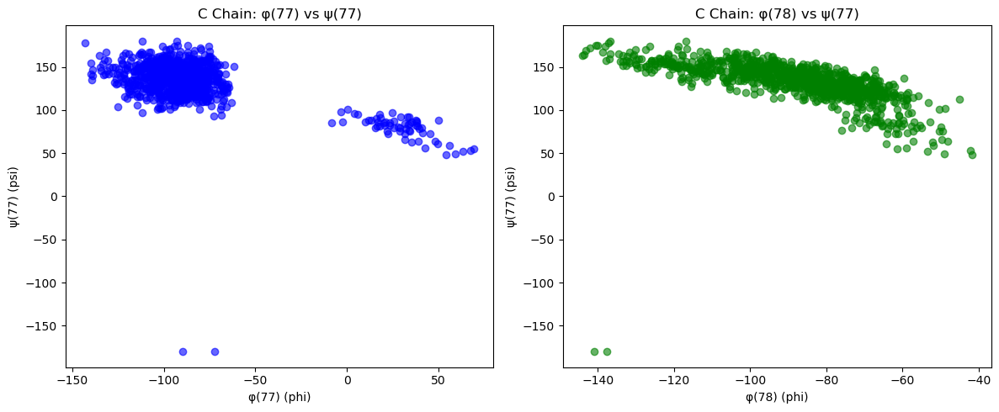

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_78.png


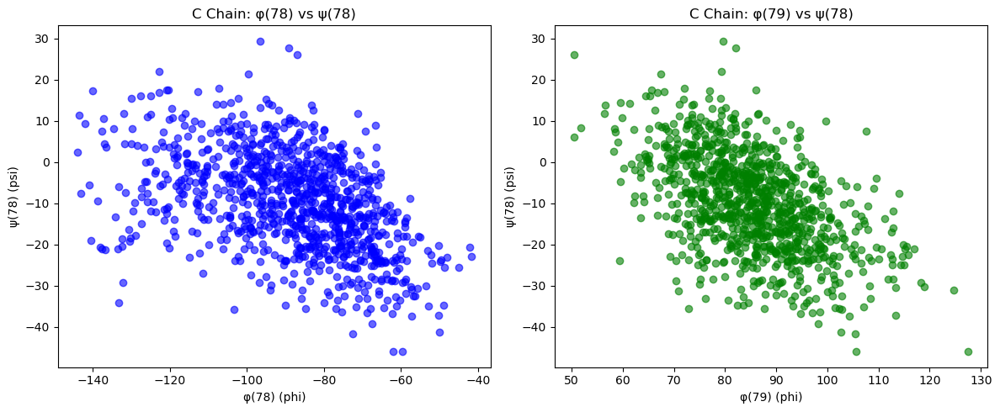

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_79.png


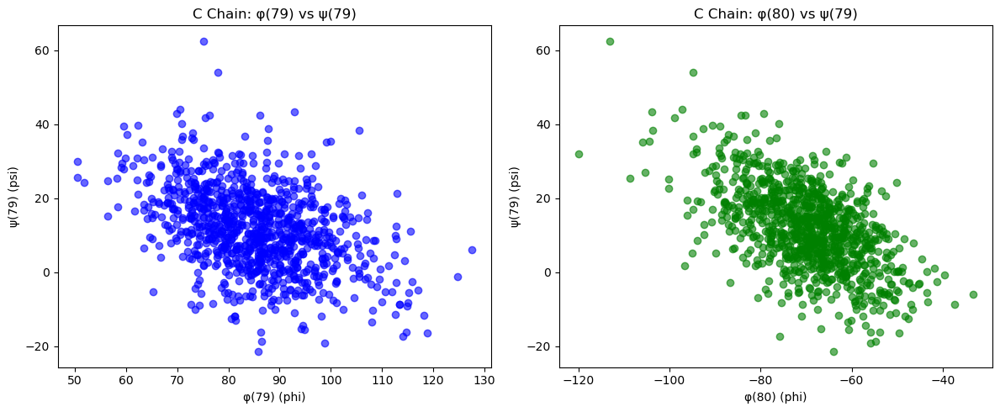

Combined plot saved as KcssA_scatter_plots_ChainC/inter_intra_torsion_scatter_80.png


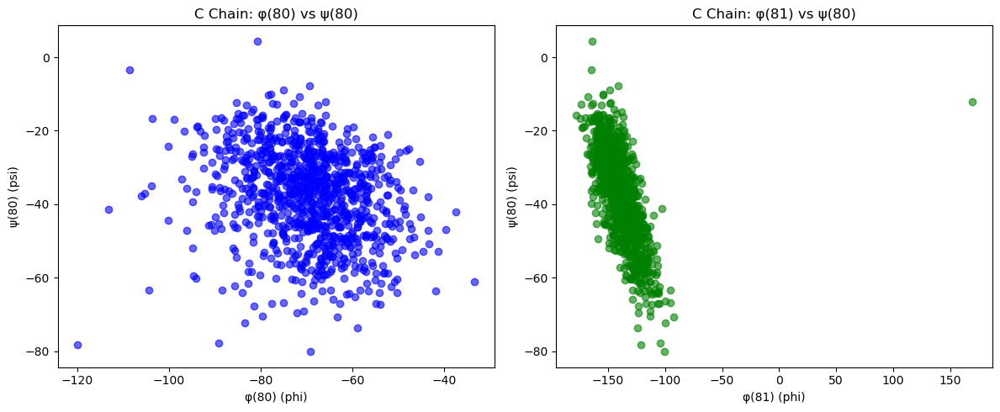

In [30]:
residues_to_plot=[52, 77, 78, 79, 80]
for residue in residues_to_plot:
    KcsA_analyzer[2].plot_scatter(residue, chains='C', output_dir='KcssA_scatter_plots_ChainC')

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_77.png


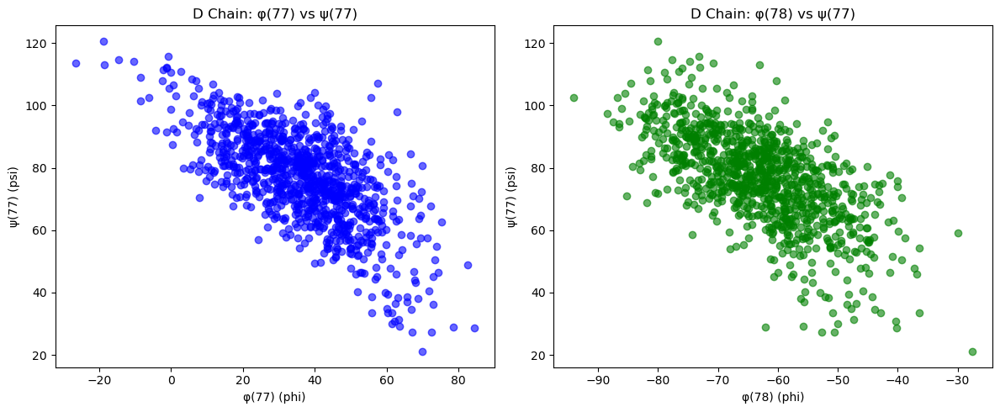

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_78.png


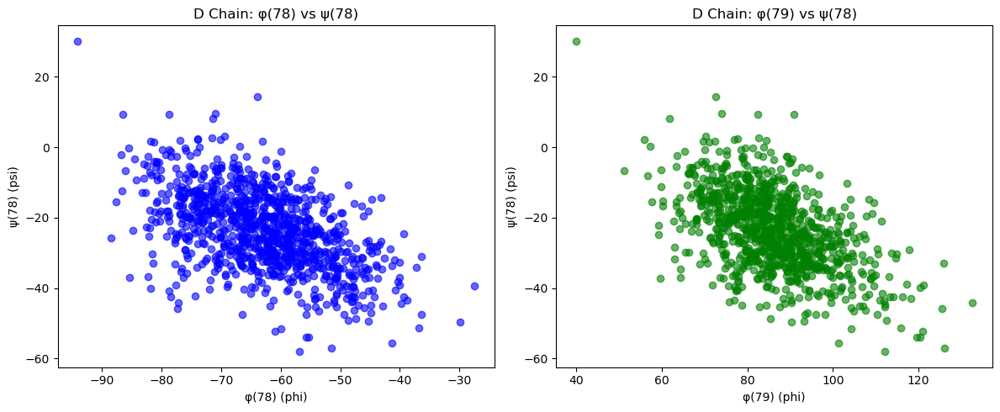

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_79.png


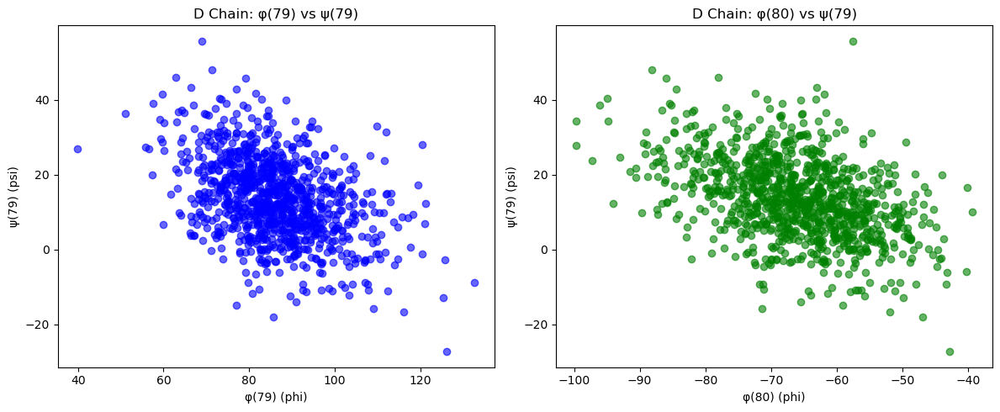

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_80.png


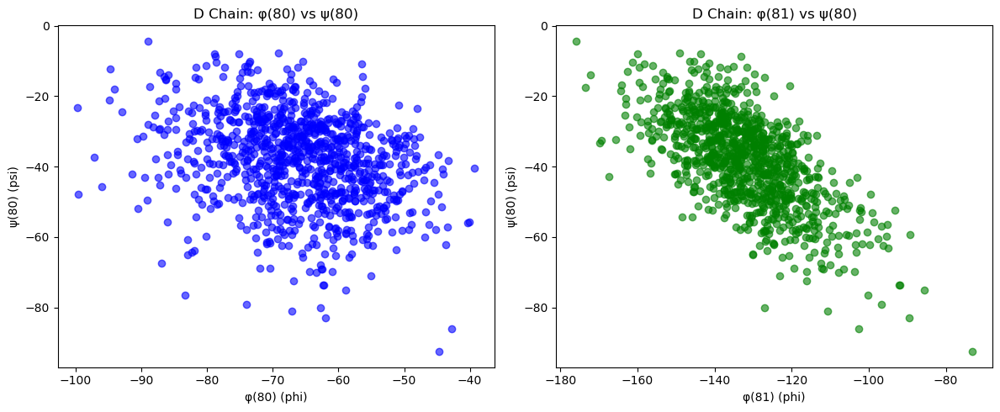

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_81.png


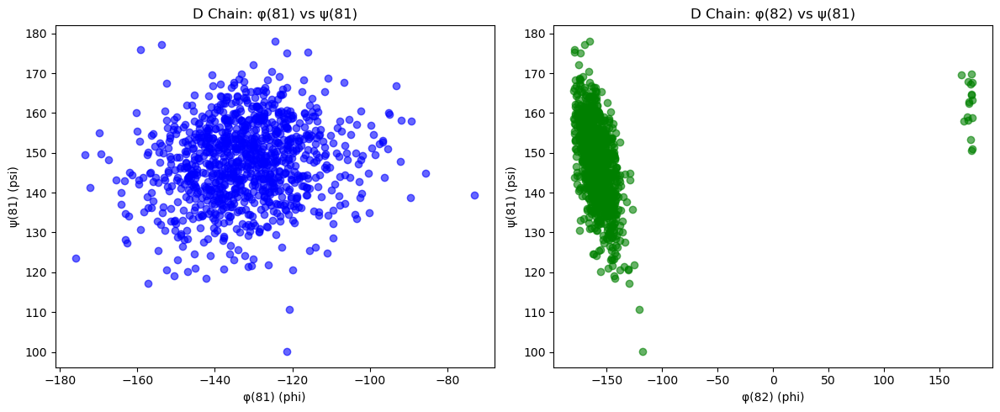

Combined plot saved as KcssA_scatter_plots_ChainD/inter_intra_torsion_scatter_82.png


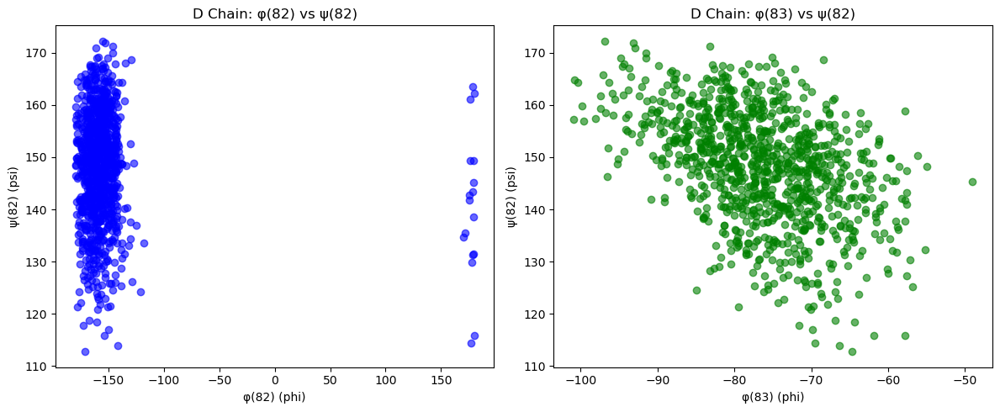

In [31]:
residues_to_plot=[77, 78, 79, 80,81, 82]
for residue in residues_to_plot:
    KcsA_analyzer[3].plot_scatter(residue, chains='D', output_dir='KcssA_scatter_plots_ChainD')

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_51_Chain_A.png


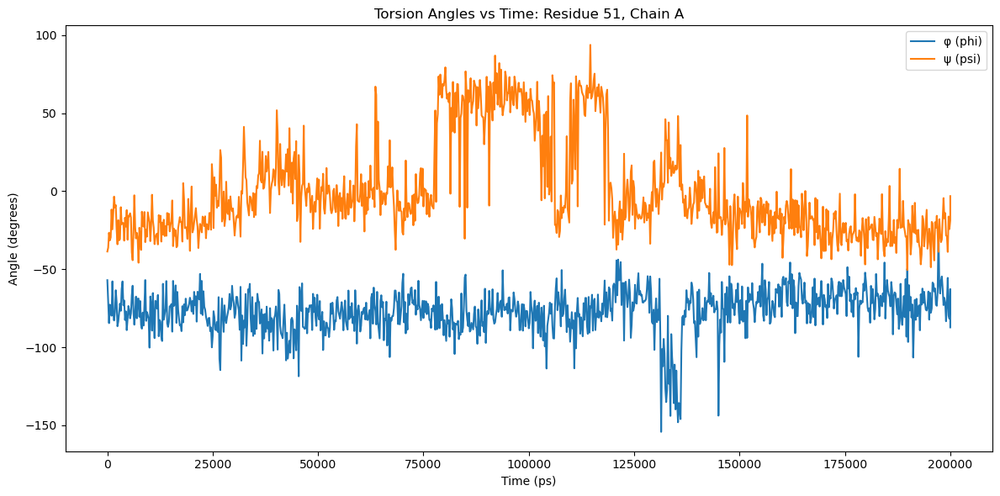

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_51_Chain_A.png


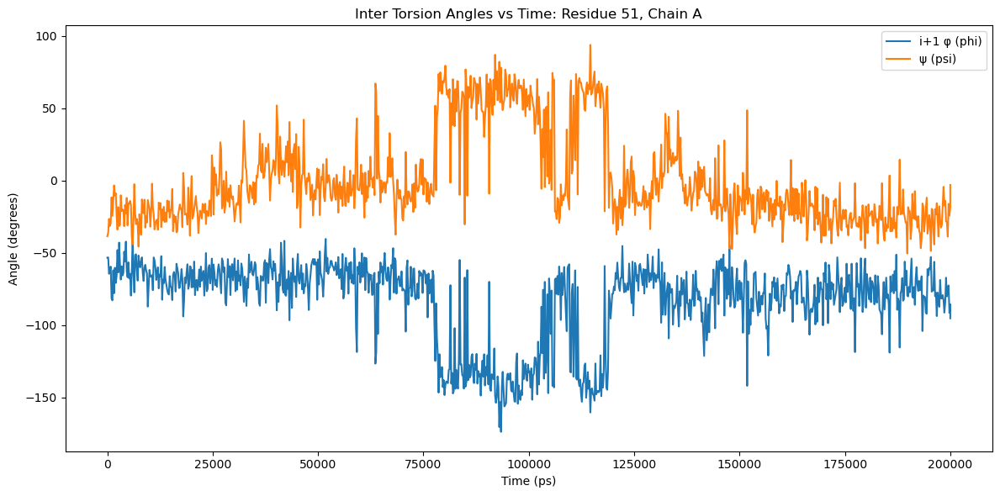

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_52_Chain_A.png


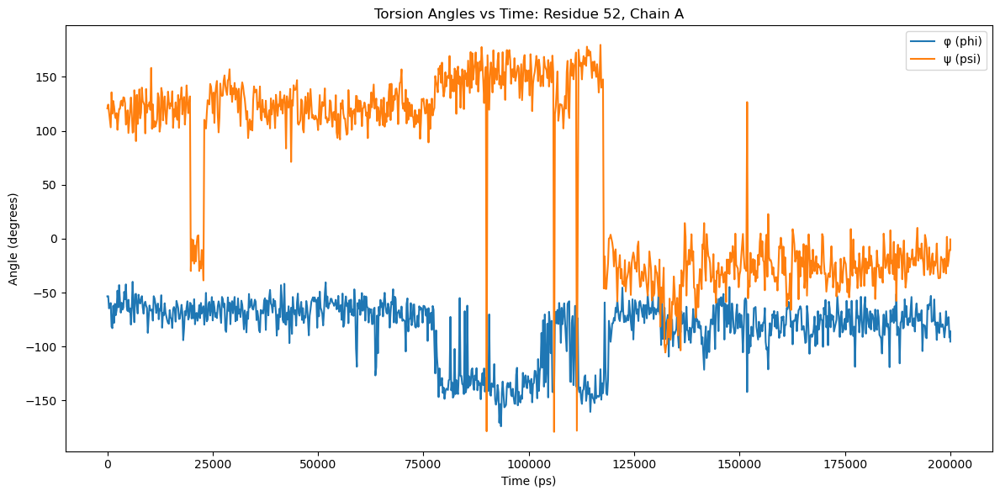

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_52_Chain_A.png


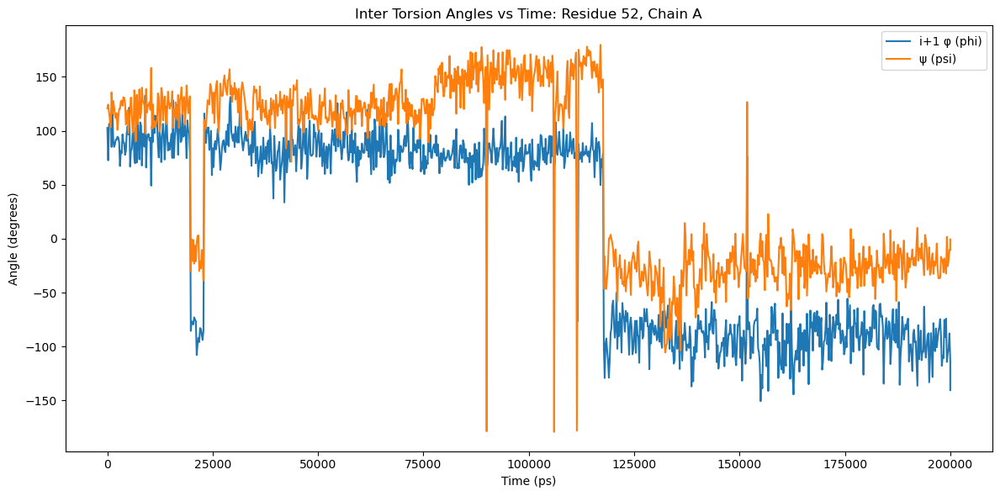

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_54_Chain_A.png


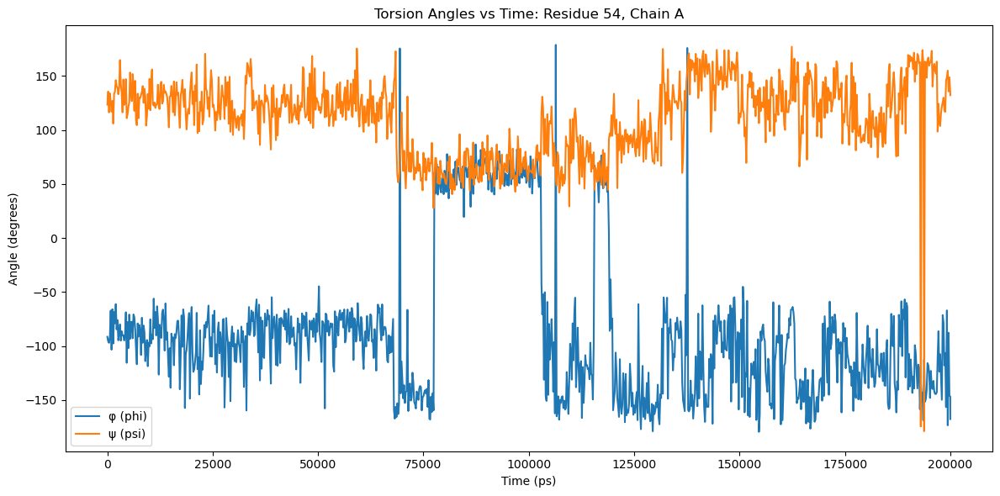

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_54_Chain_A.png


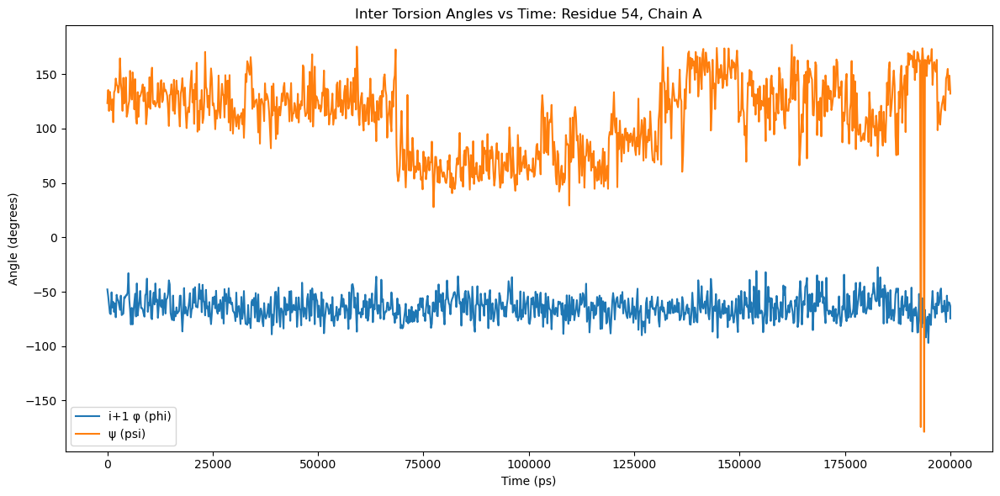

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_76_Chain_A.png


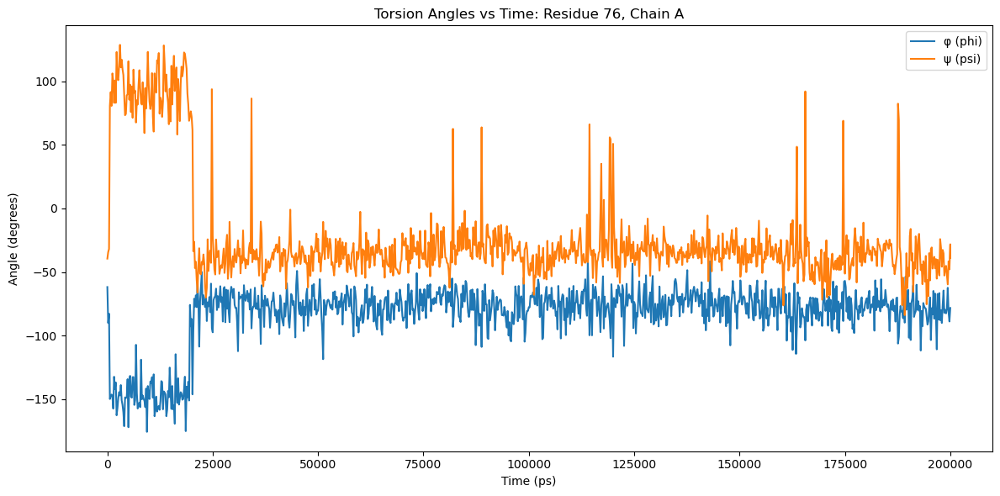

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_76_Chain_A.png


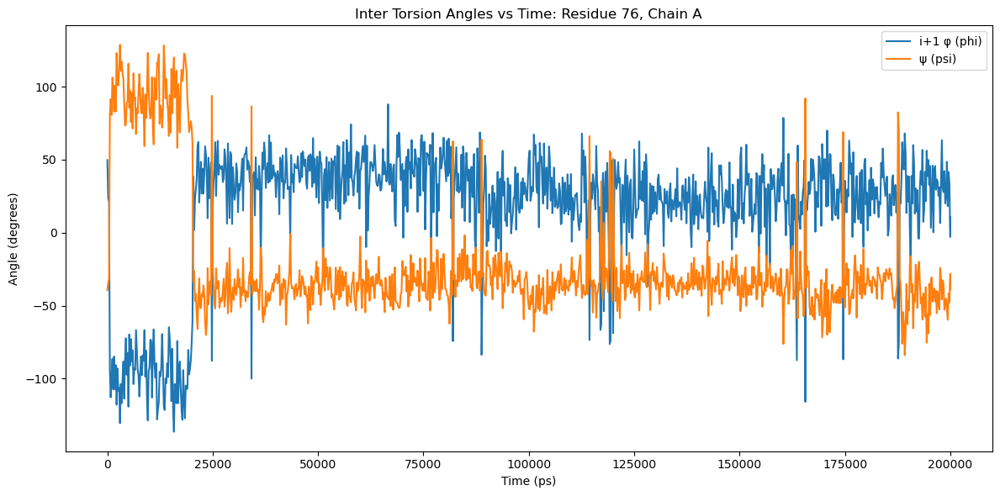

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_77_Chain_A.png


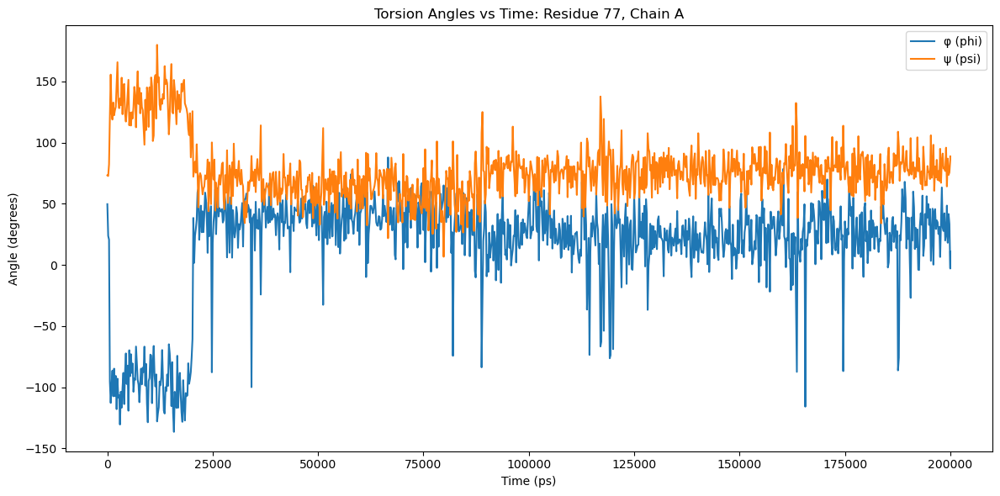

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_77_Chain_A.png


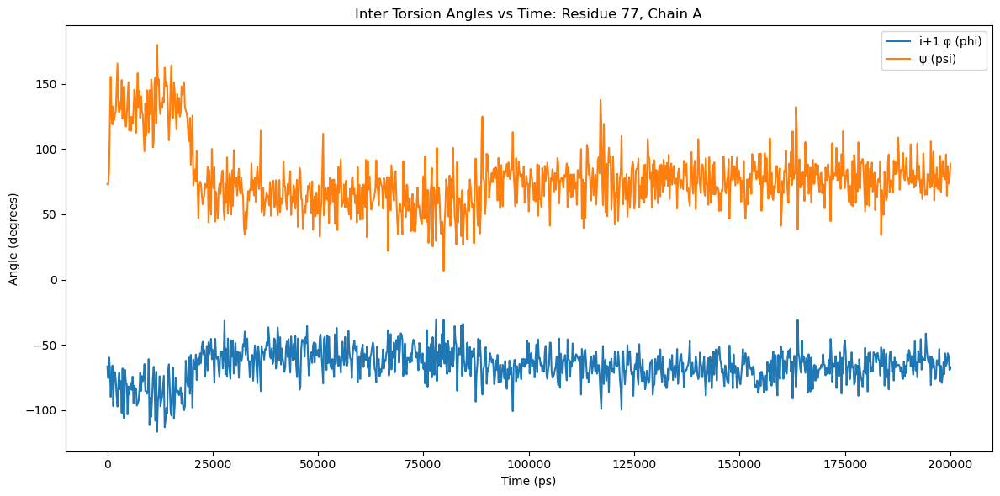

Plot saved as KcsA_torsion_vs_time_ChainA/Torsion_vs_Time_Residue_78_Chain_A.png


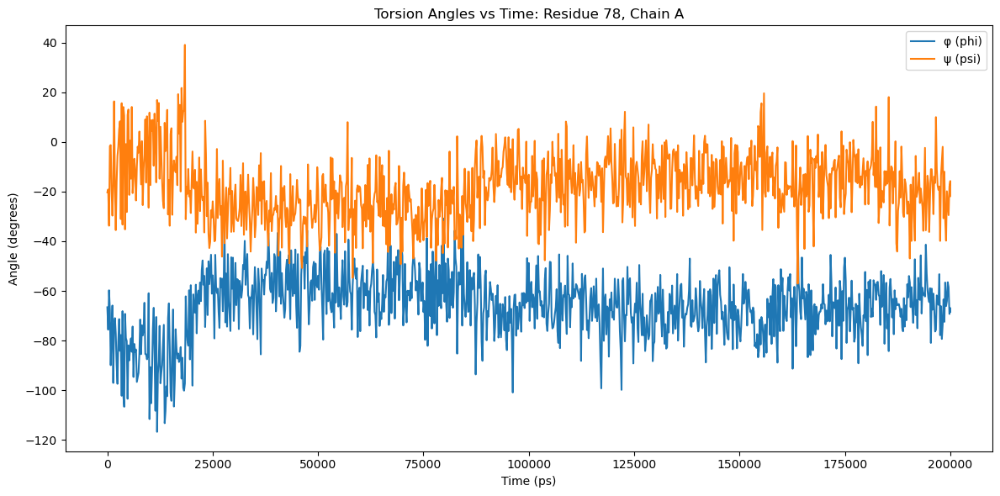

Plot saved as KcsA_inter_torsion_vs_time_ChainA/Inter_Torsion_vs_Time_Residue_78_Chain_A.png


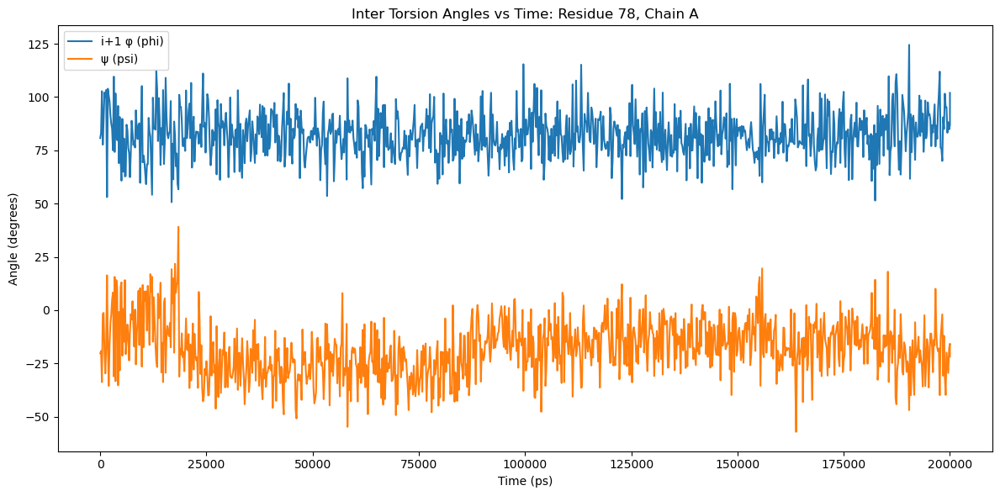

In [33]:
from torsion_analysis_module2 import *
# import plot functions to plot torsion angles(intra and inter) vs time 

# plot the torsion angles over time
residues_to_plot=[51, 52,54,76, 77, 78]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='A', analyzer=KcsA_analyzer[0], output_dir='KcsA_torsion_vs_time_ChainA')
    plot_inter_torsion_vs_time(residue=residue, chain='A', analyzer=KcsA_analyzer[0], output_dir='KcsA_inter_torsion_vs_time_ChainA')

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_52_Chain_B.png


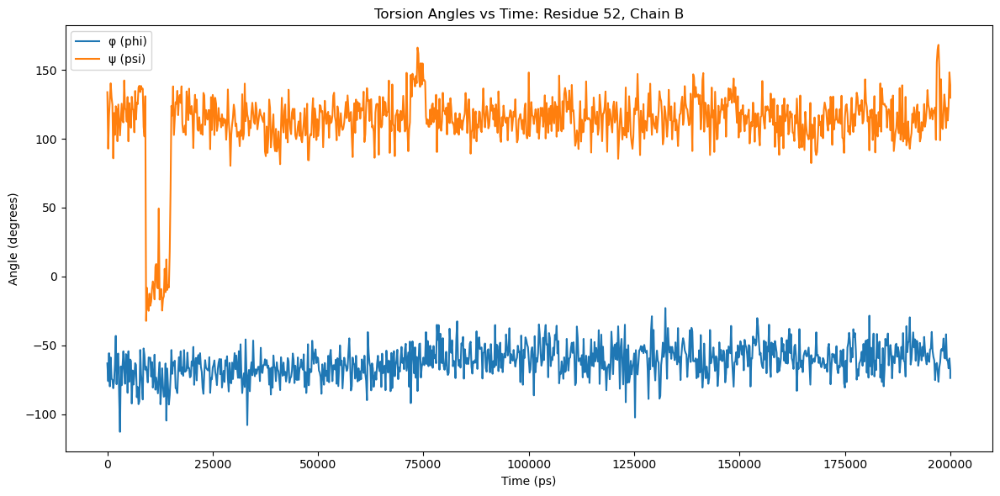

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_52_Chain_B.png


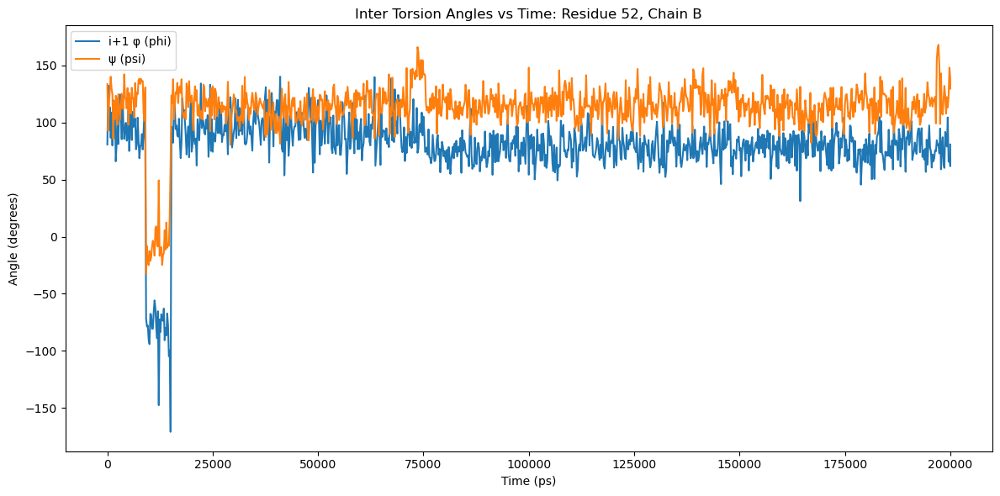

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_54_Chain_B.png


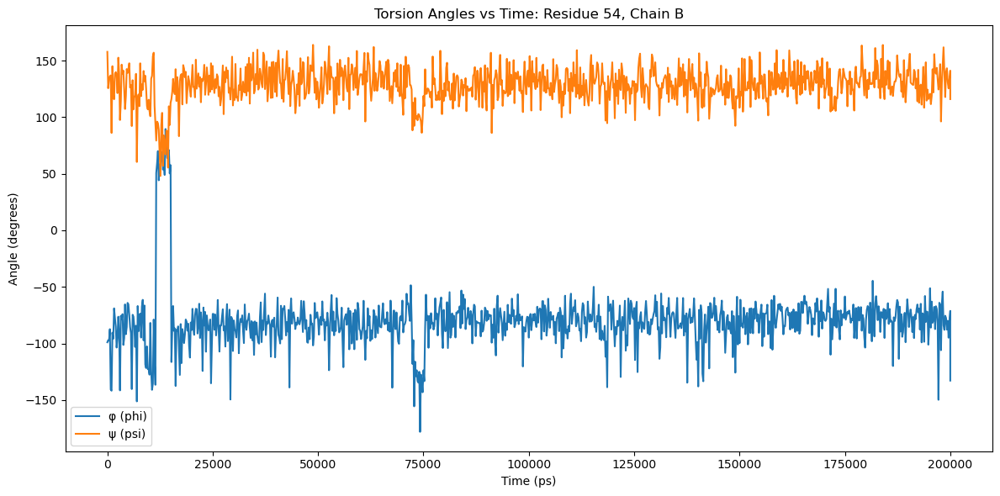

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_54_Chain_B.png


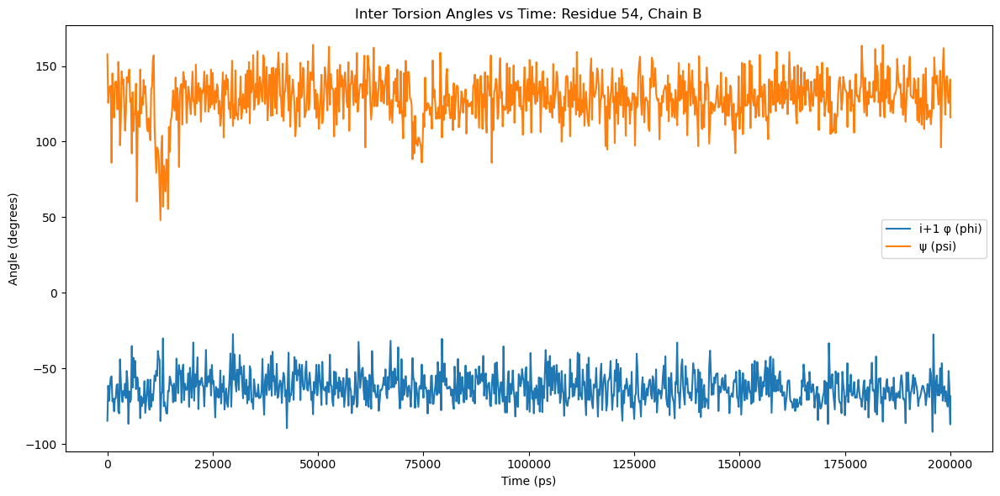

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_76_Chain_B.png


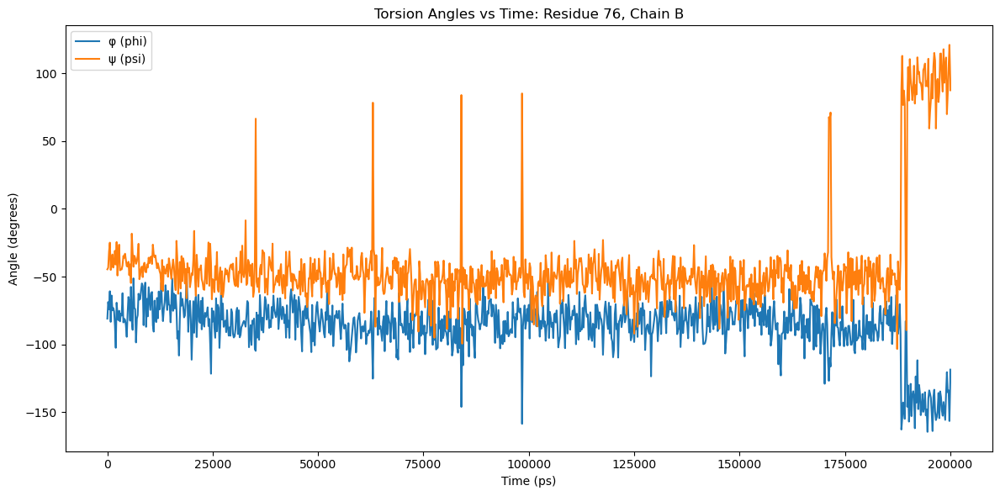

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_76_Chain_B.png


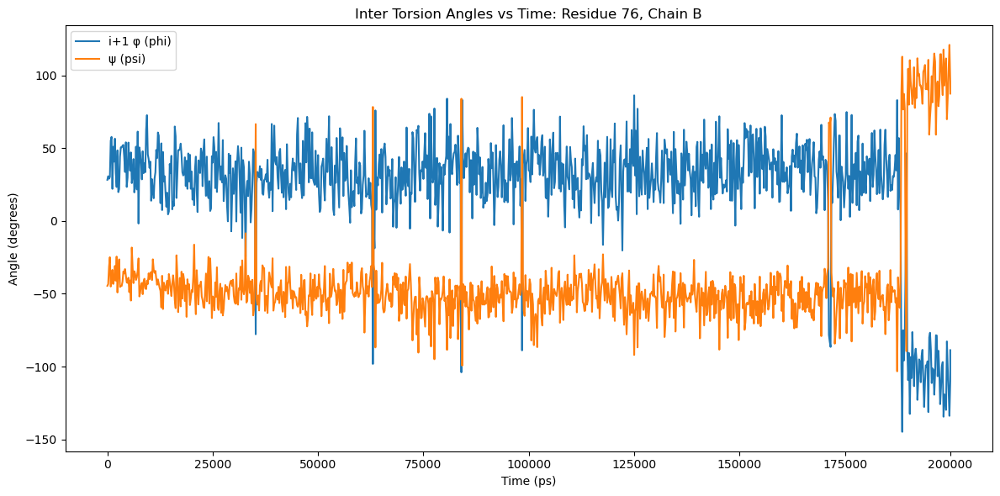

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_77_Chain_B.png


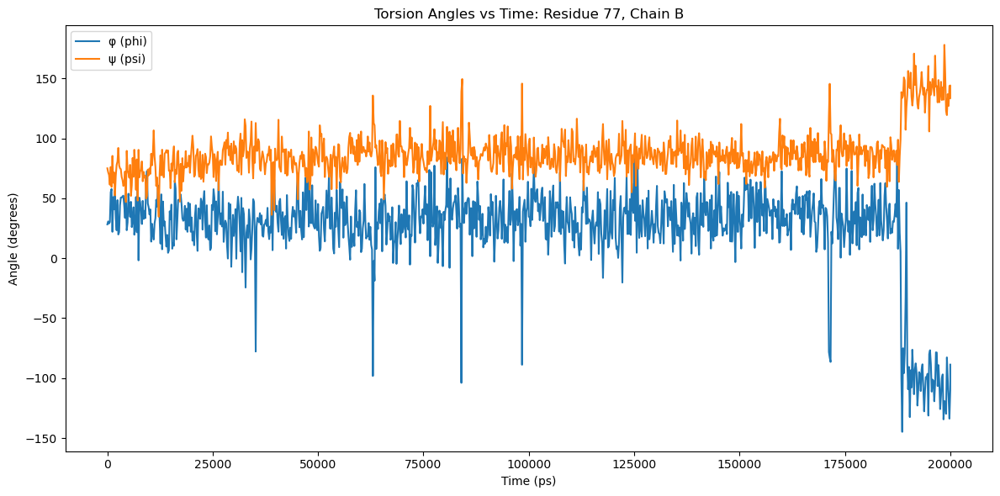

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_77_Chain_B.png


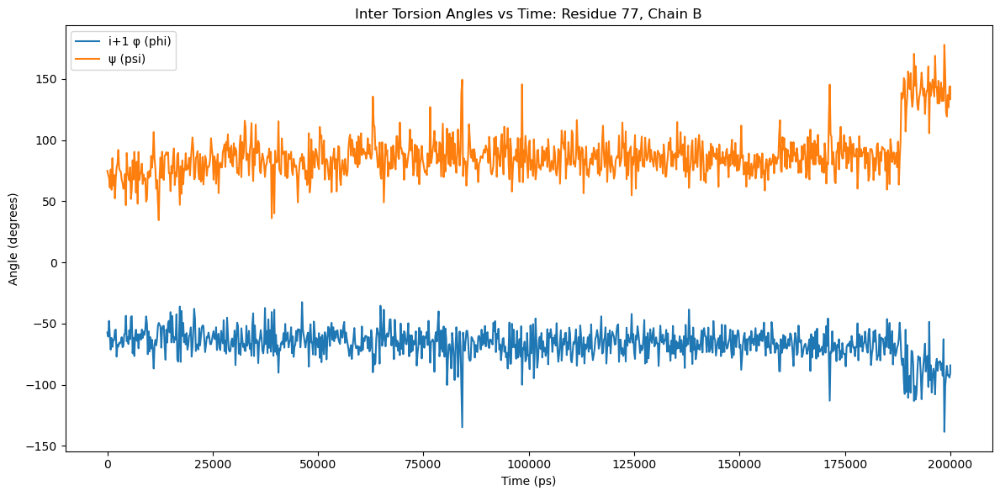

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_78_Chain_B.png


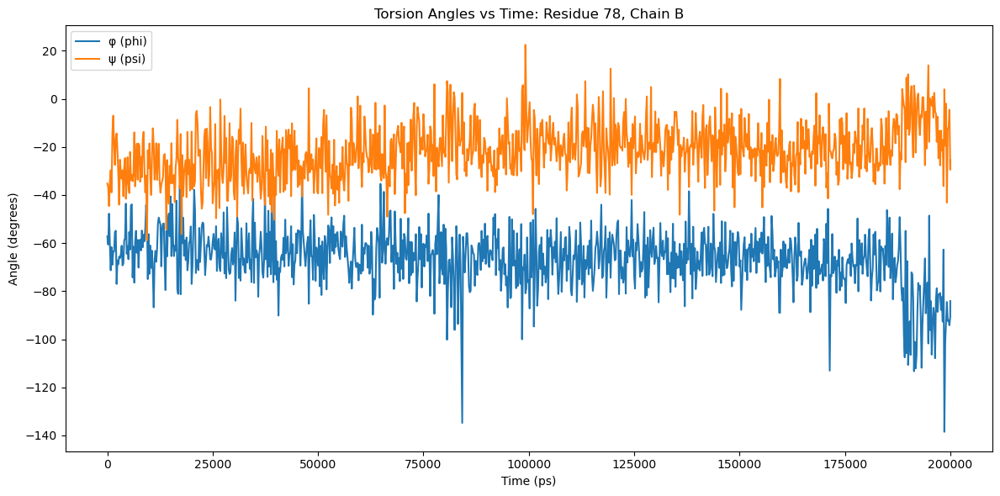

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_78_Chain_B.png


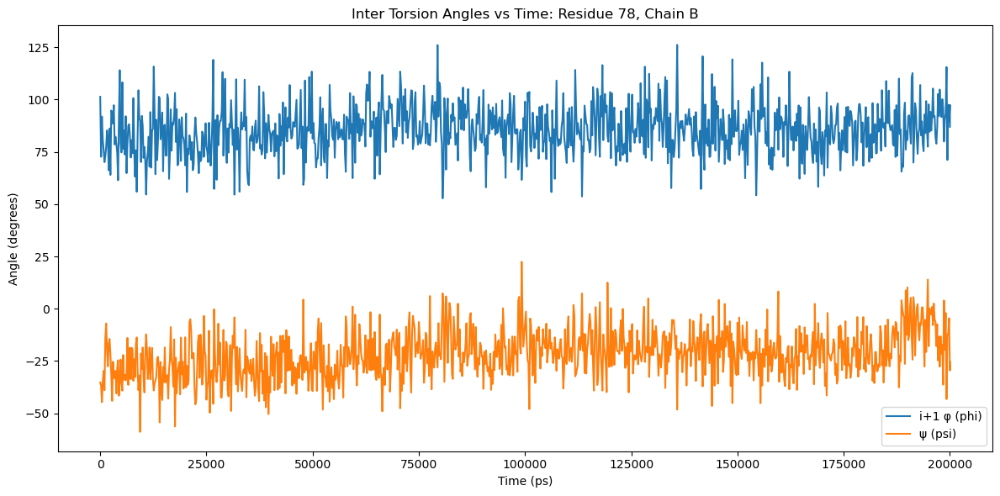

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_79_Chain_B.png


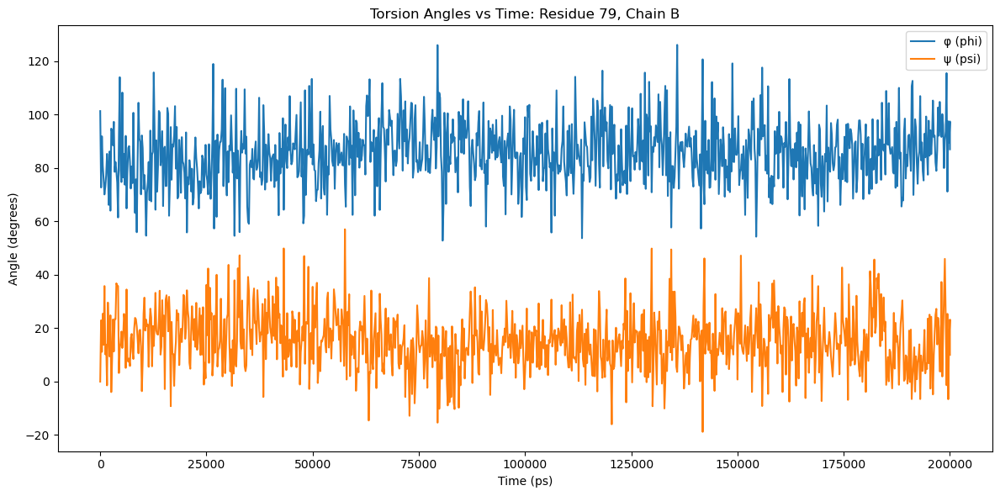

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_79_Chain_B.png


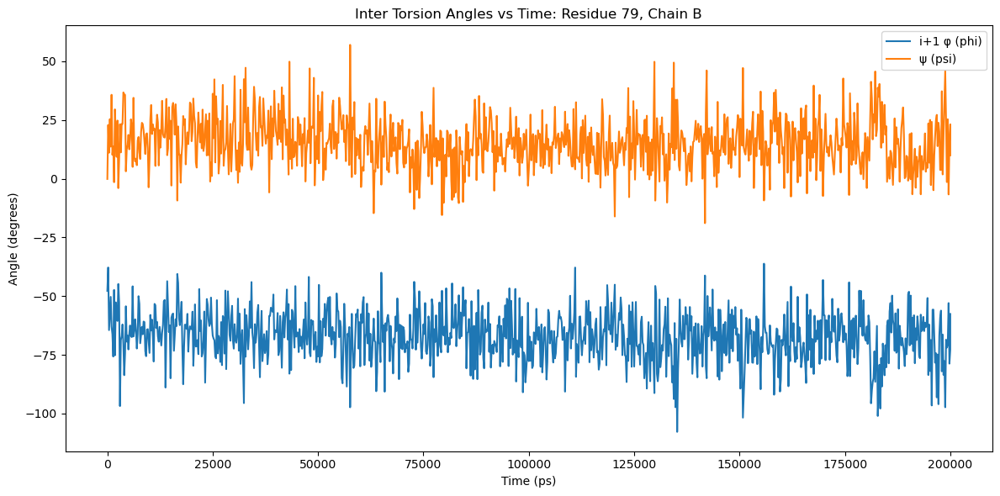

Plot saved as KcsA_torsion_vs_time_ChainB/Torsion_vs_Time_Residue_80_Chain_B.png


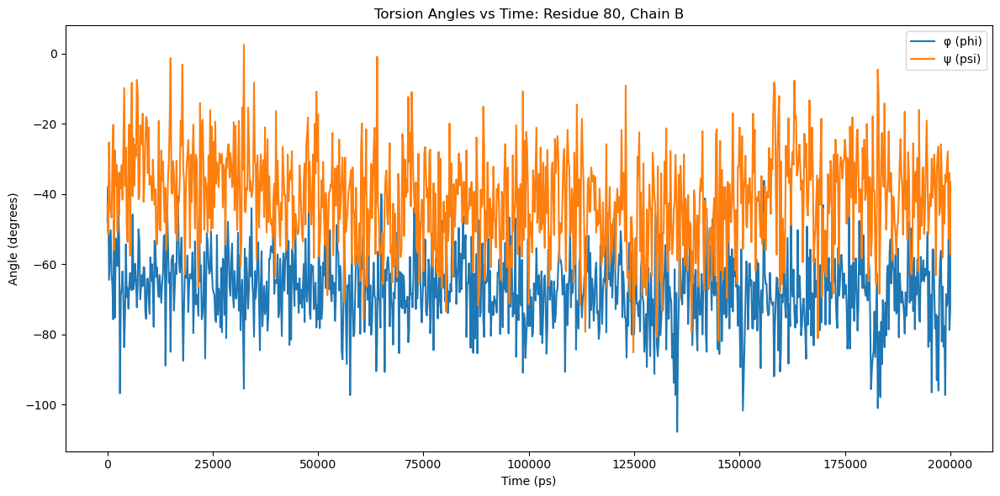

Plot saved as KcsA_inter_torsion_vs_time_ChainB/Inter_Torsion_vs_Time_Residue_80_Chain_B.png


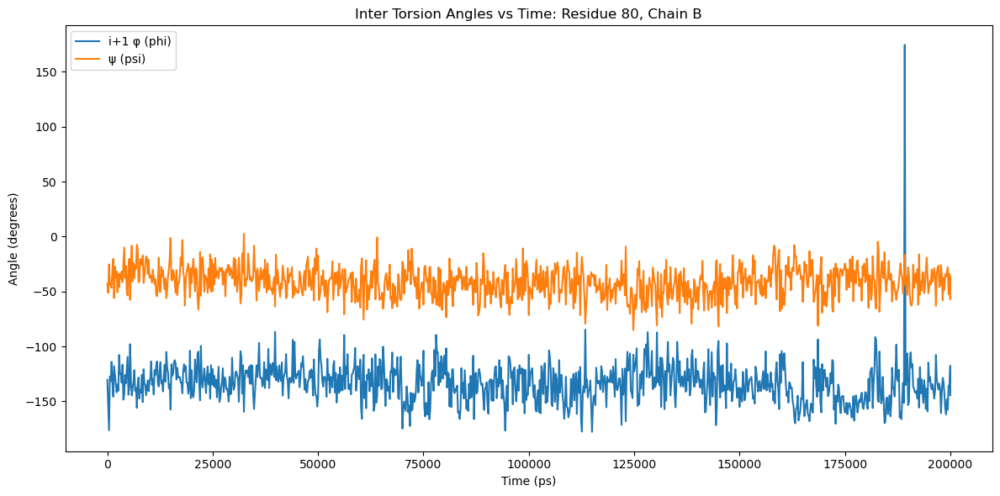

In [34]:
residues_to_plot=[52, 54, 76, 77, 78, 79, 80]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='B', analyzer=KcsA_analyzer[1], output_dir='KcsA_torsion_vs_time_ChainB')
    plot_inter_torsion_vs_time(residue=residue, chain='B', analyzer=KcsA_analyzer[1], output_dir='KcsA_inter_torsion_vs_time_ChainB')

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_52_Chain_C.png


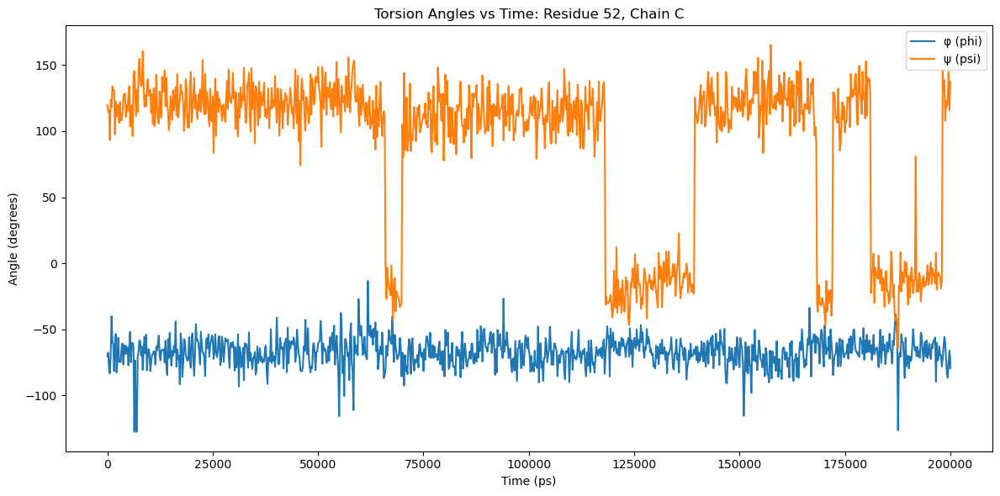

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_52_Chain_C.png


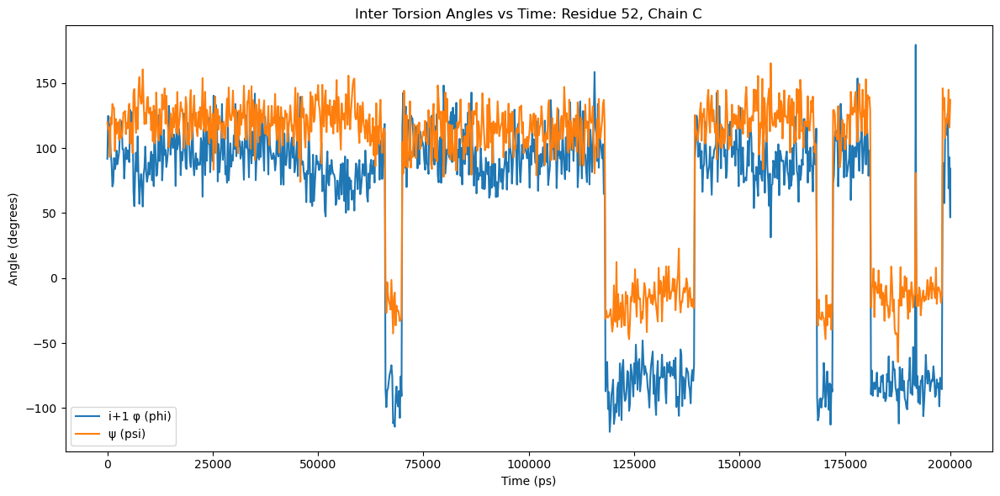

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_54_Chain_C.png


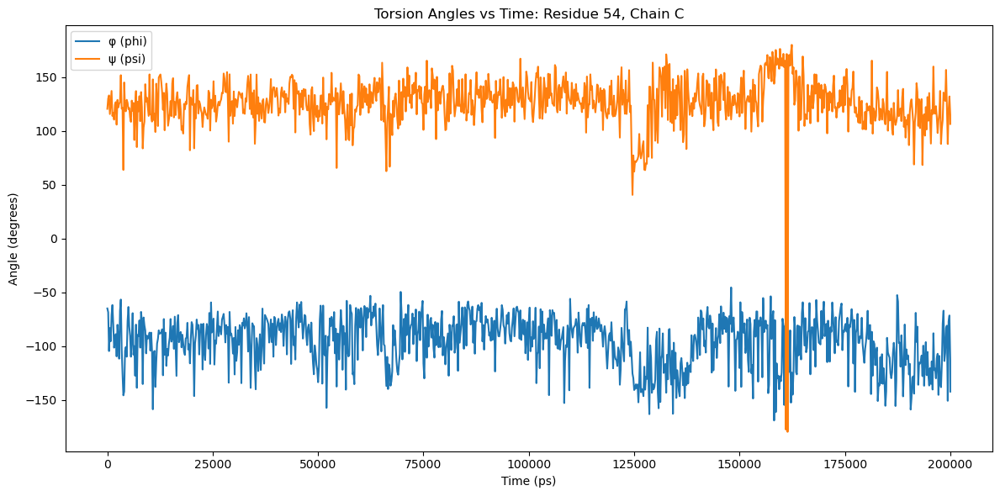

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_54_Chain_C.png


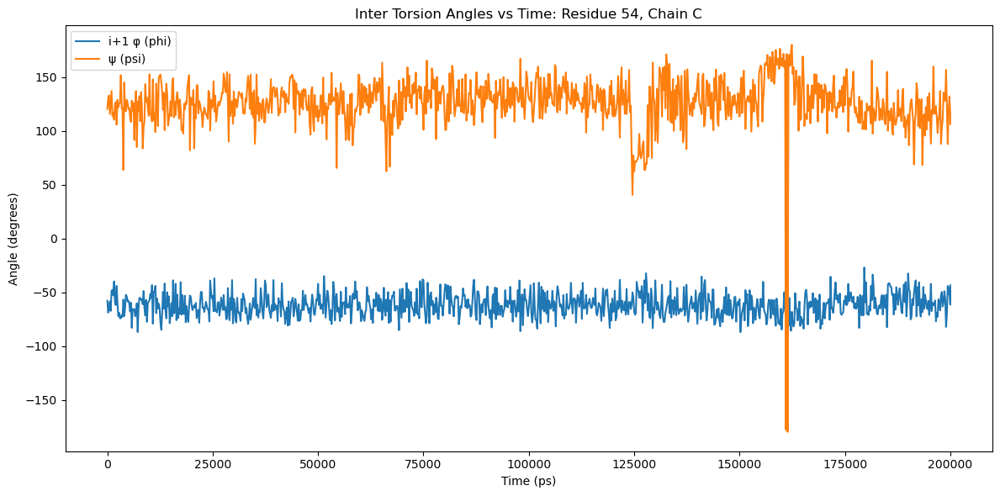

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_76_Chain_C.png


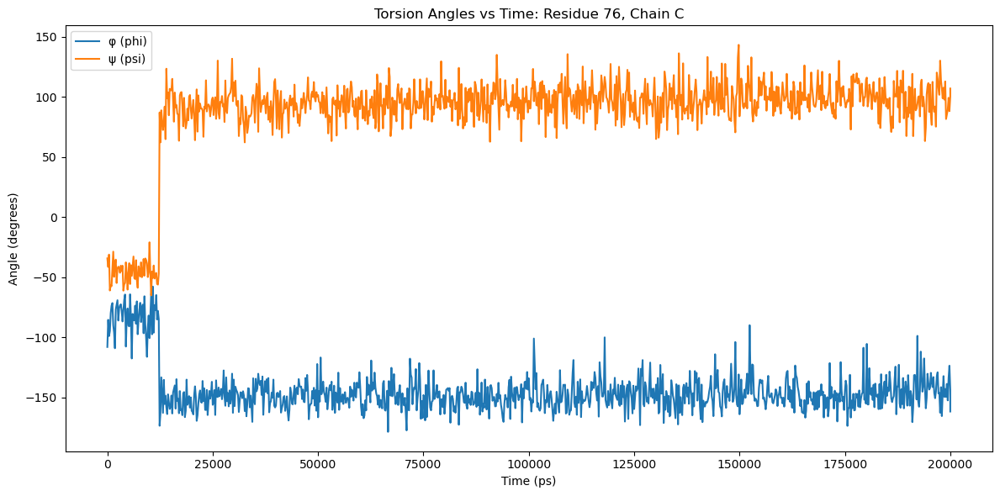

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_76_Chain_C.png


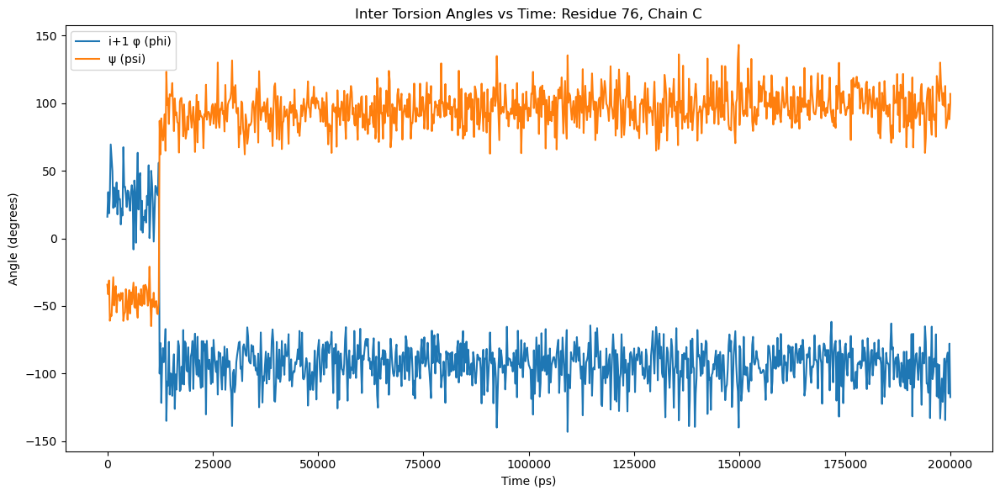

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_77_Chain_C.png


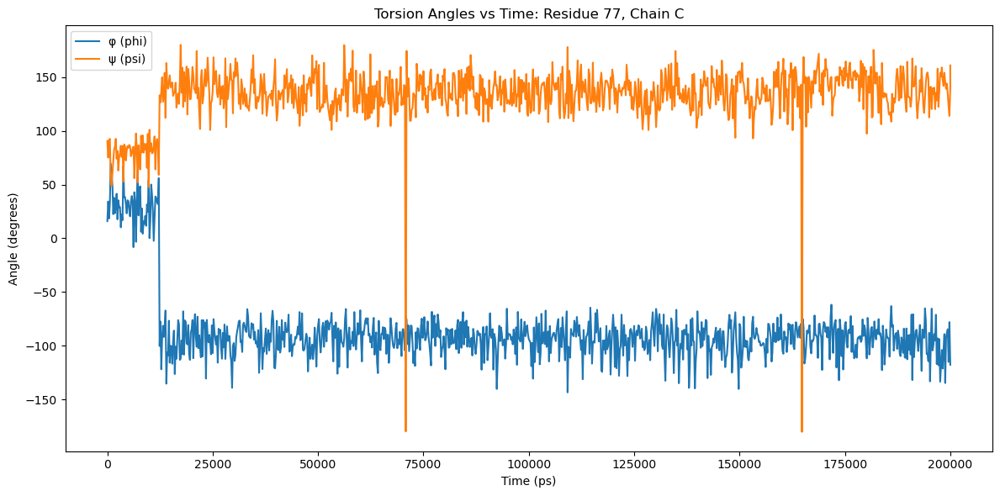

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_77_Chain_C.png


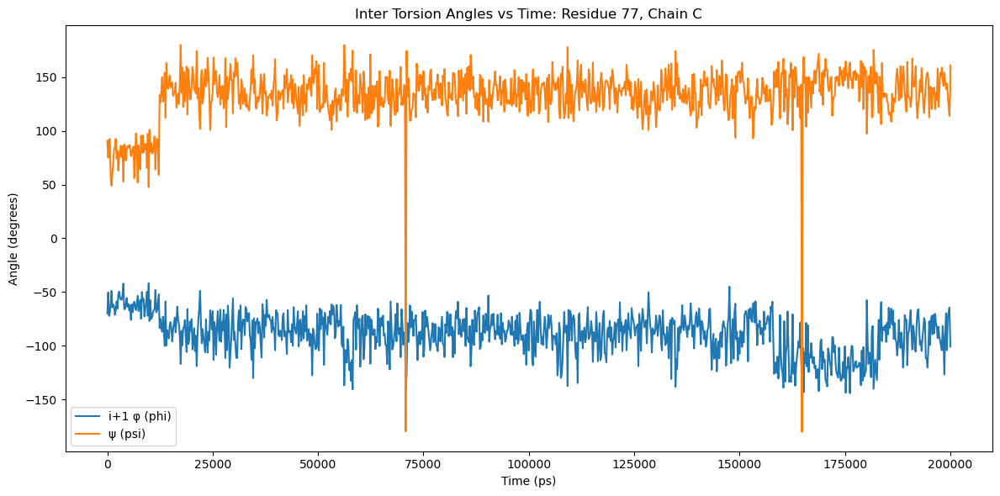

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_78_Chain_C.png


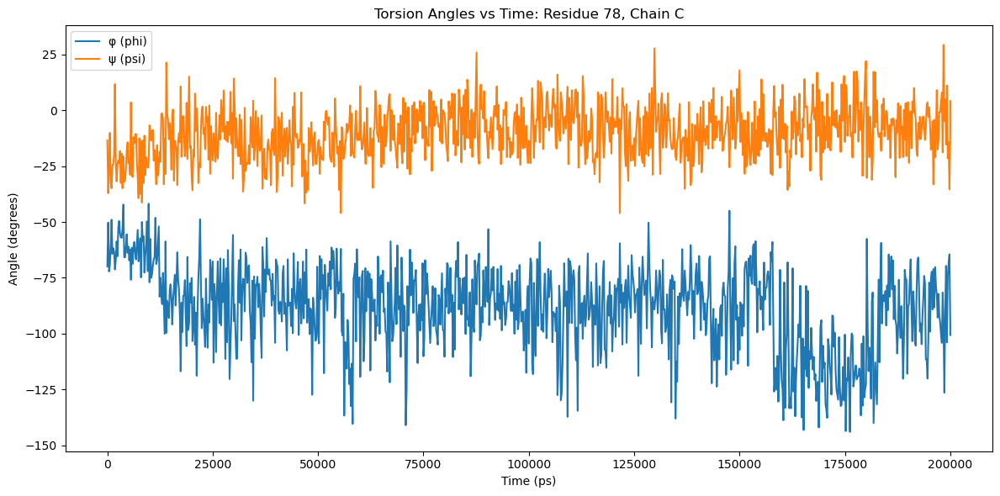

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_78_Chain_C.png


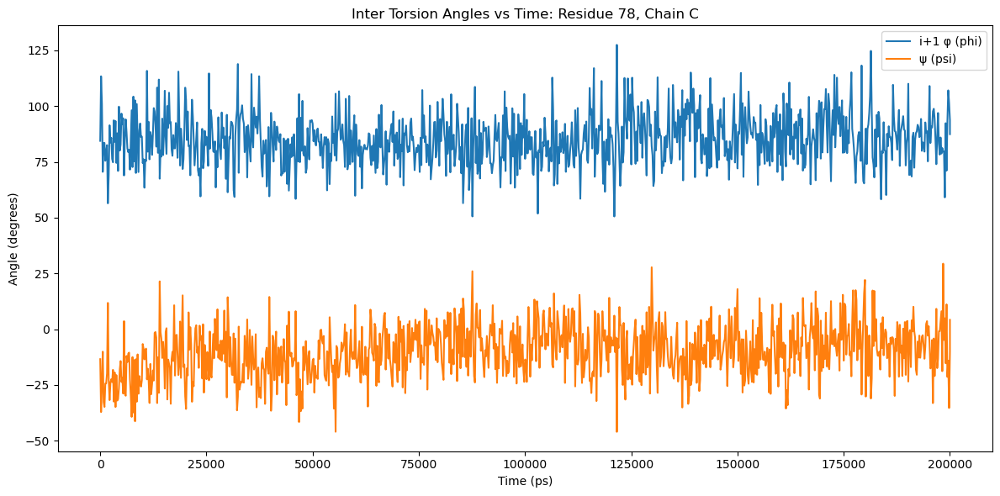

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_79_Chain_C.png


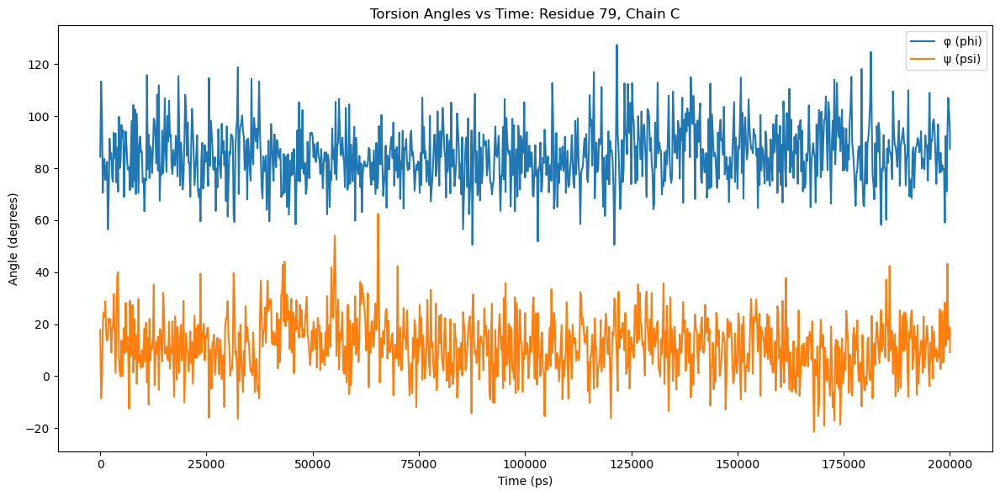

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_79_Chain_C.png


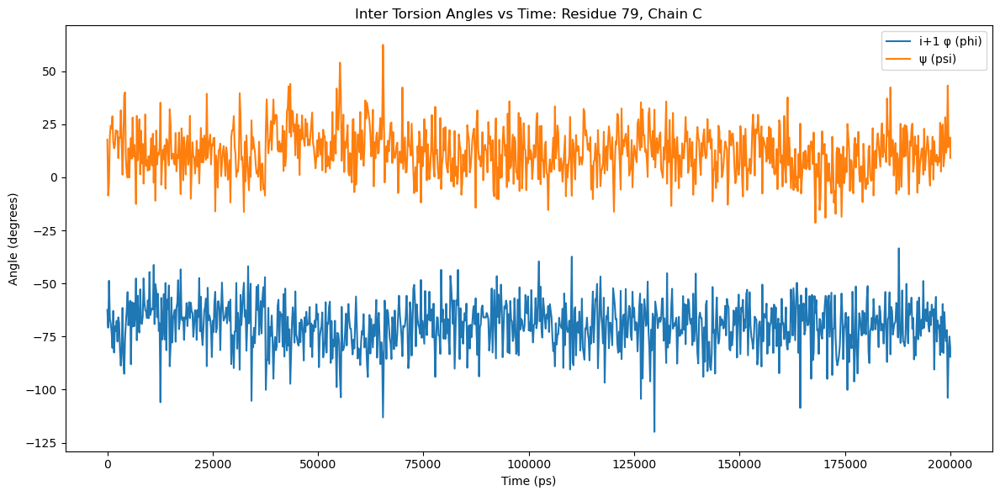

Plot saved as KcsA_torsion_vs_time_ChainC/Torsion_vs_Time_Residue_80_Chain_C.png


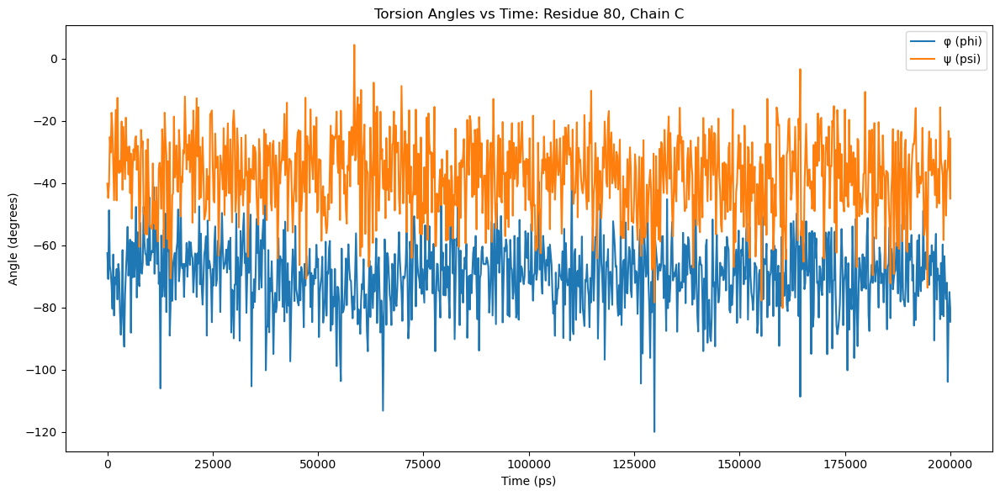

Plot saved as KcsA_inter_torsion_vs_time_ChainC/Inter_Torsion_vs_Time_Residue_80_Chain_C.png


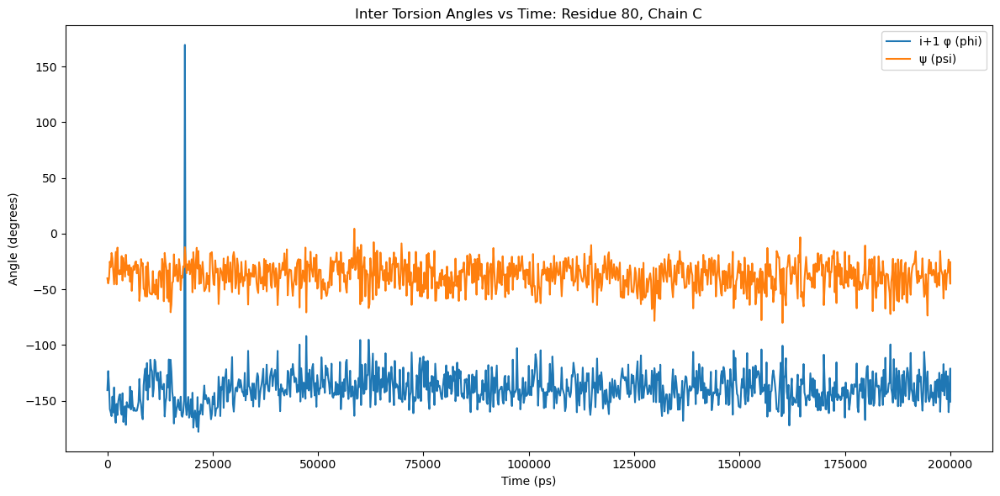

In [35]:
residues_to_plot=[52, 54, 76, 77, 78, 79, 80]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='C', analyzer=KcsA_analyzer[2], output_dir='KcsA_torsion_vs_time_ChainC')
    plot_inter_torsion_vs_time(residue=residue, chain='C', analyzer=KcsA_analyzer[2], output_dir='KcsA_inter_torsion_vs_time_ChainC')

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_52_Chain_D.png


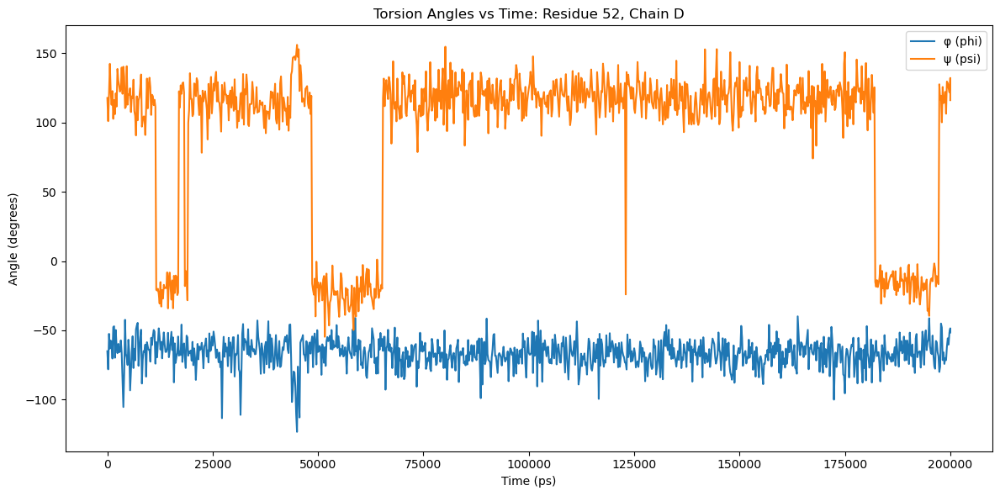

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_52_Chain_D.png


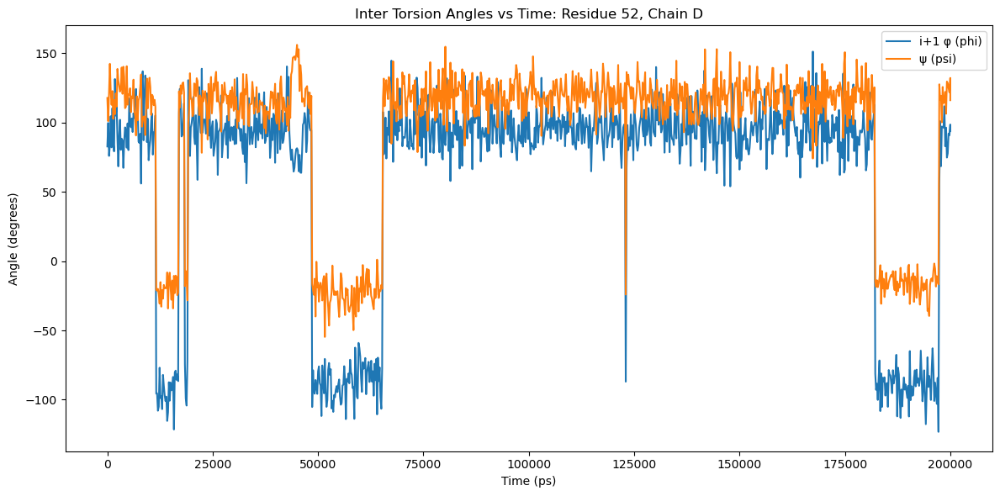

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_54_Chain_D.png


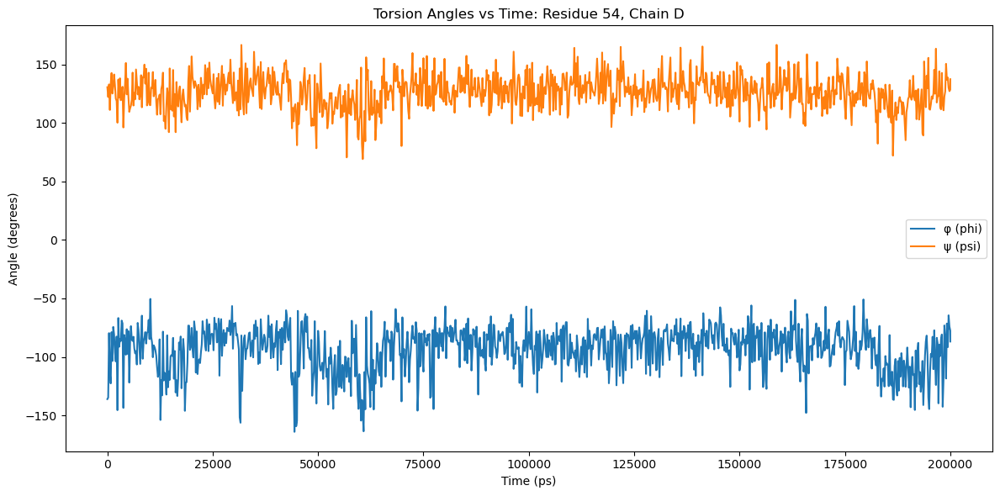

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_54_Chain_D.png


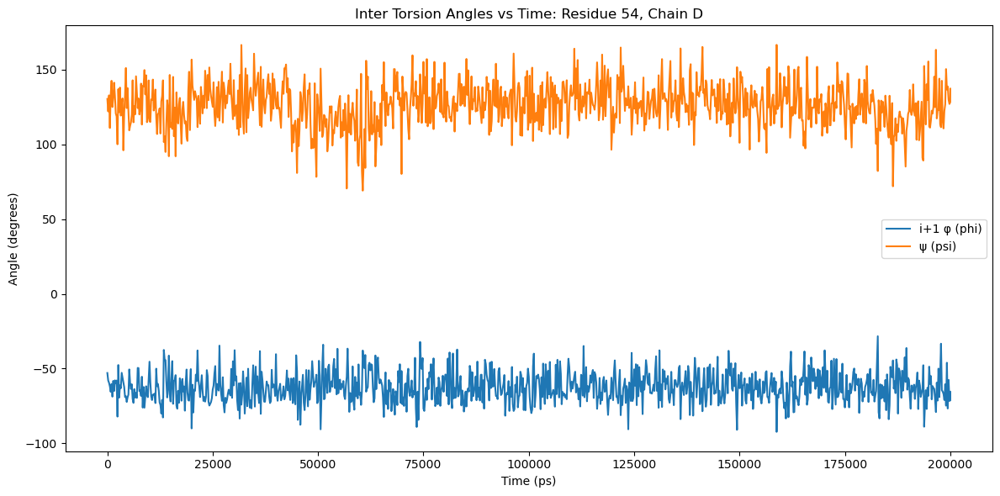

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_76_Chain_D.png


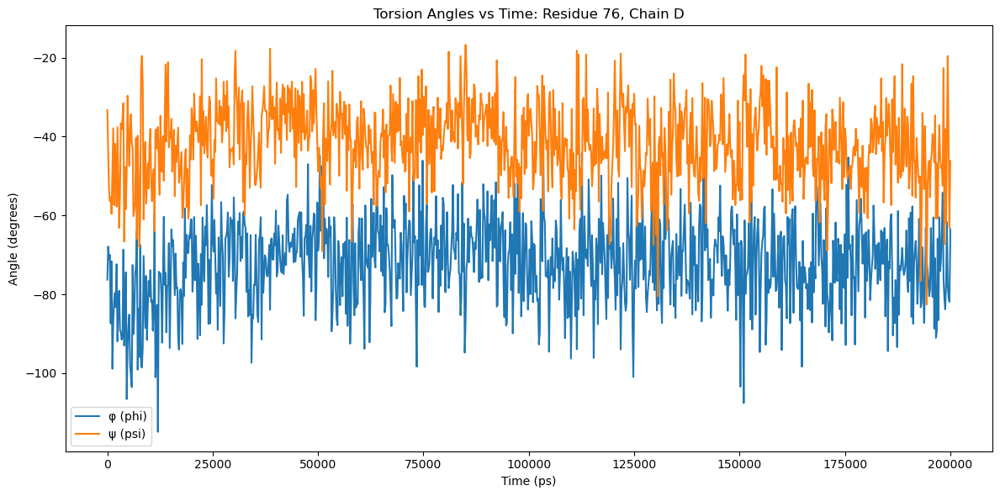

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_76_Chain_D.png


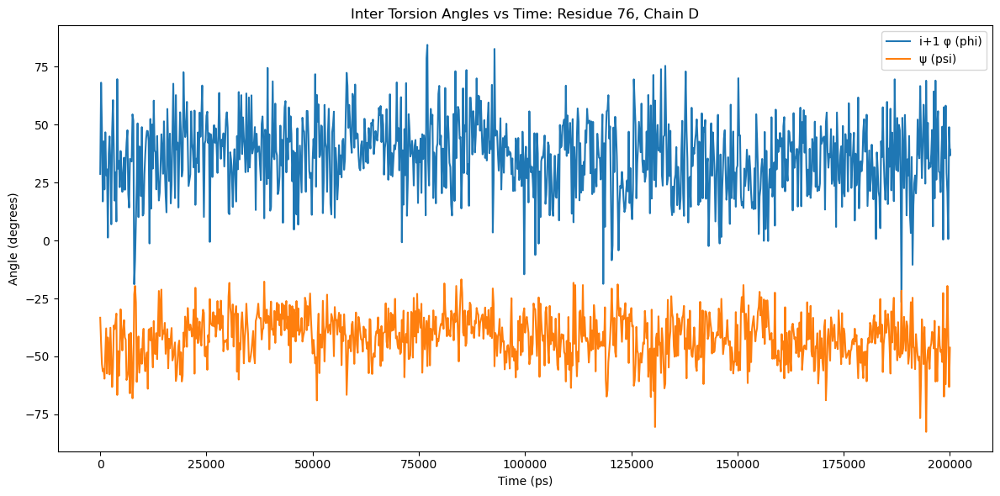

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_77_Chain_D.png


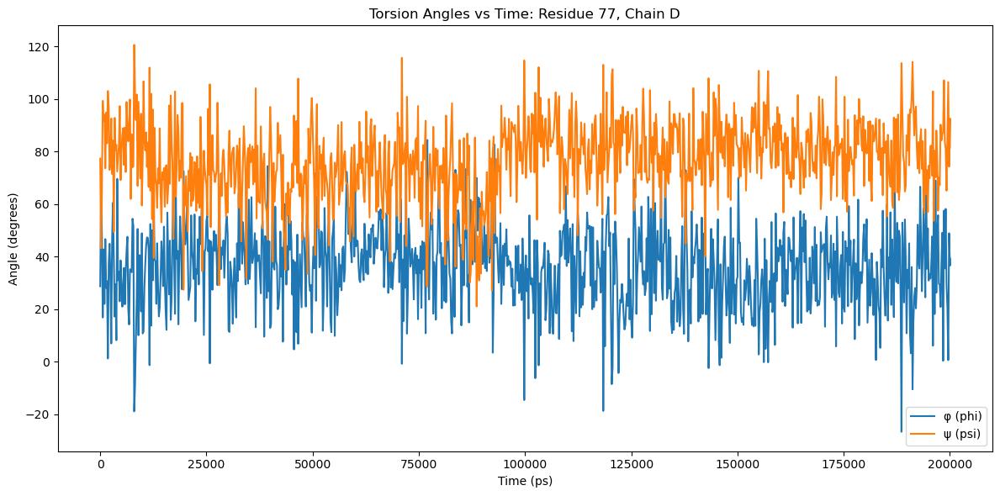

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_77_Chain_D.png


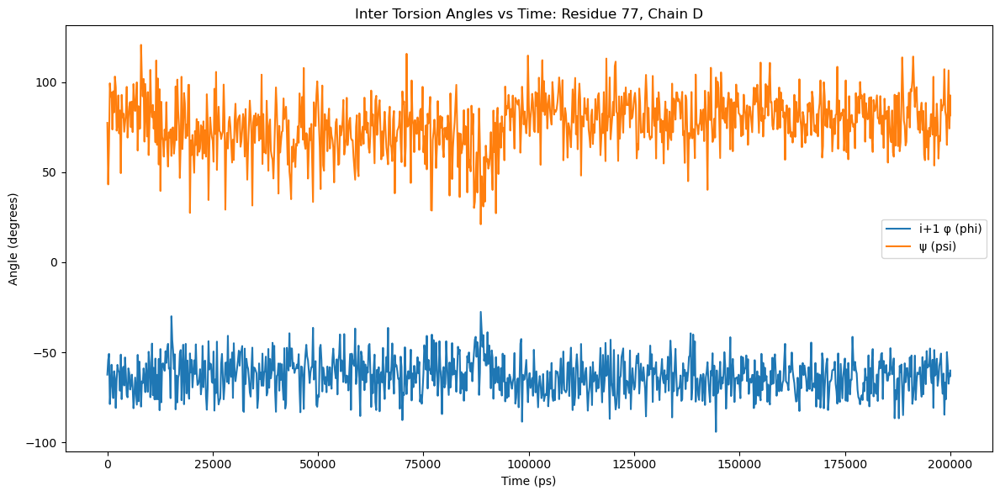

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_78_Chain_D.png


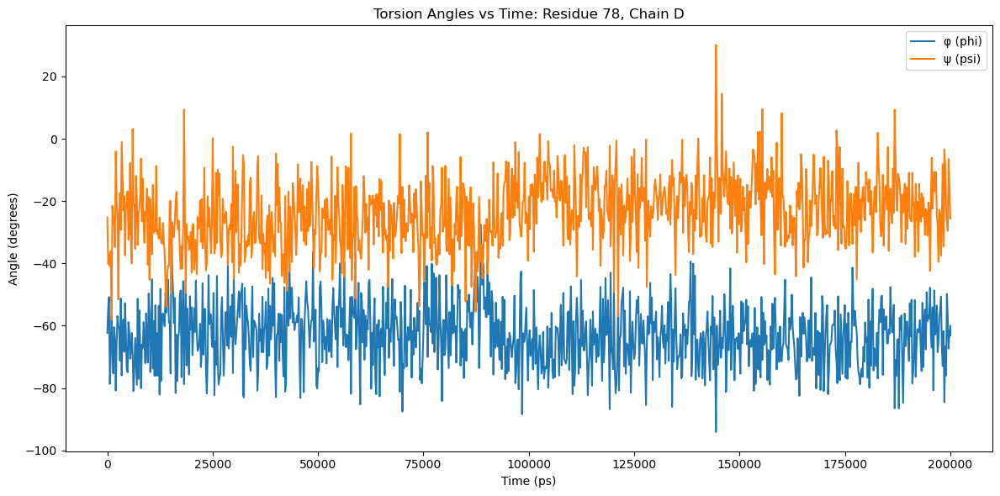

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_78_Chain_D.png


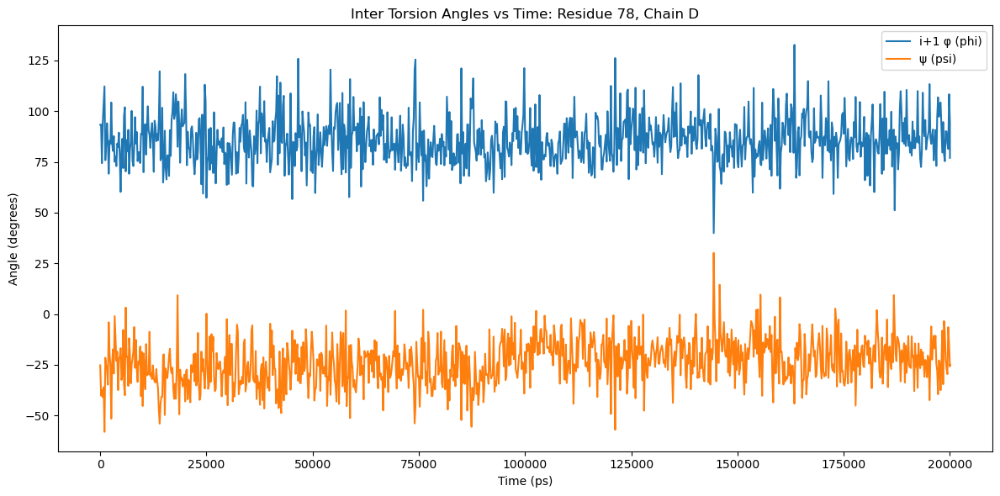

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_79_Chain_D.png


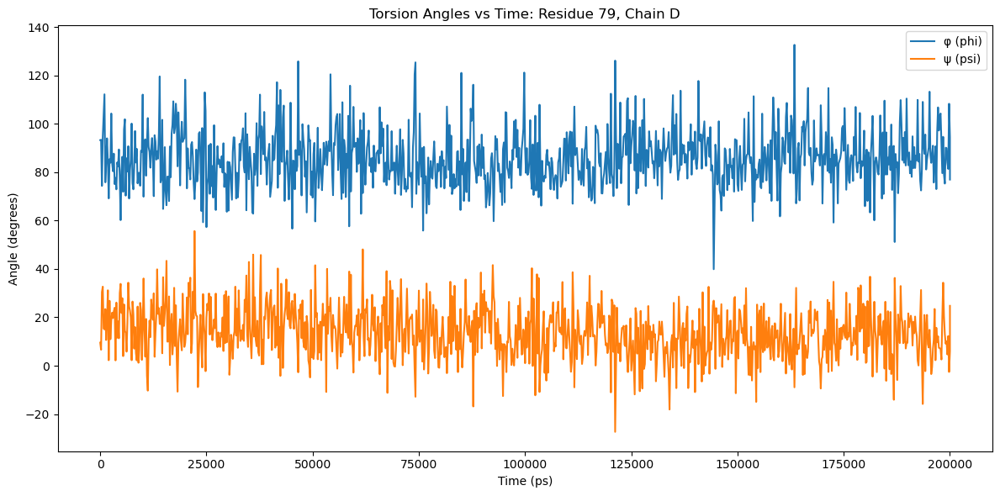

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_79_Chain_D.png


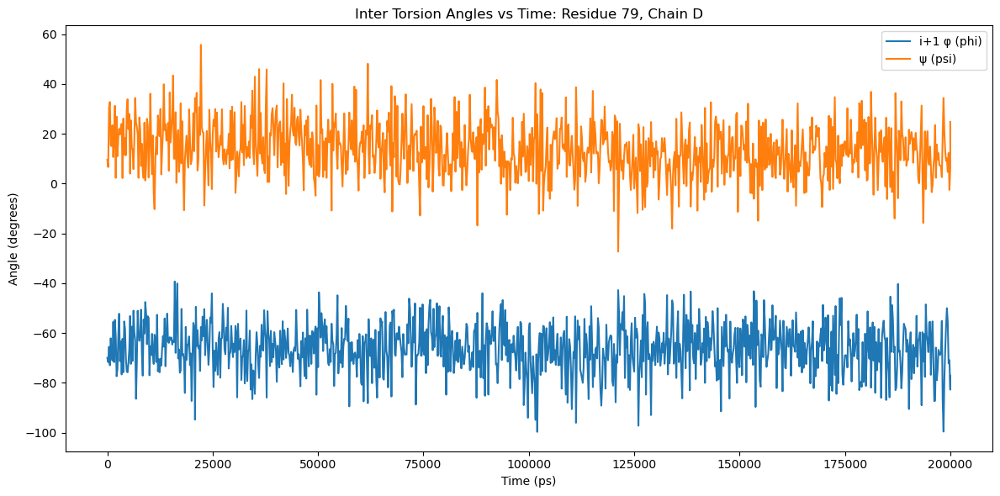

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_80_Chain_D.png


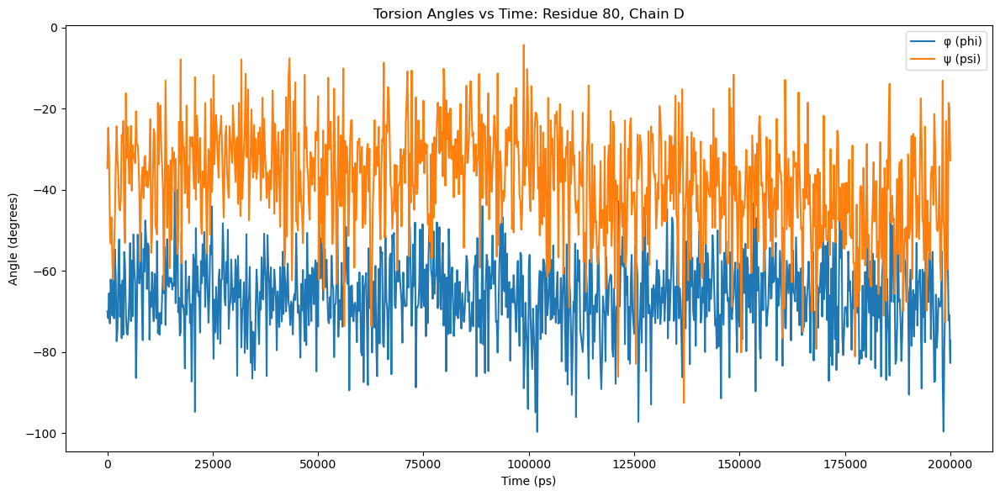

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_80_Chain_D.png


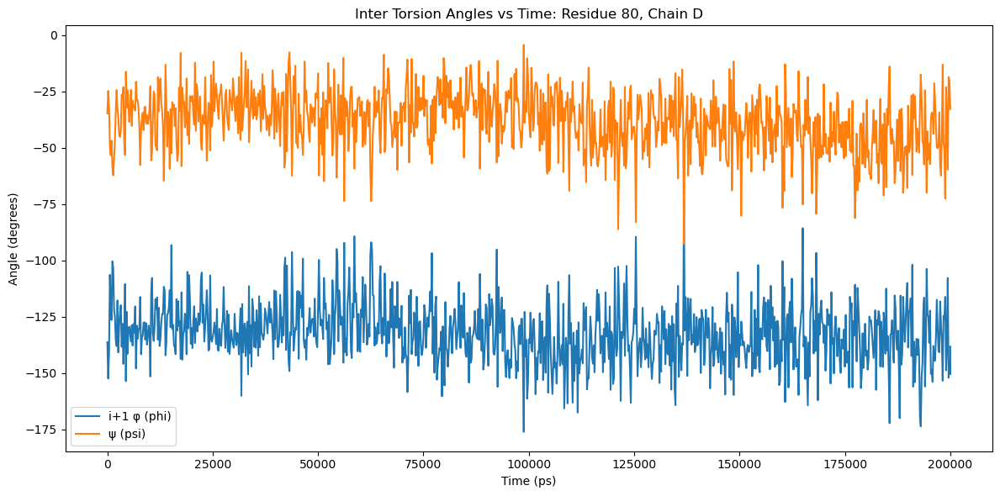

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_81_Chain_D.png


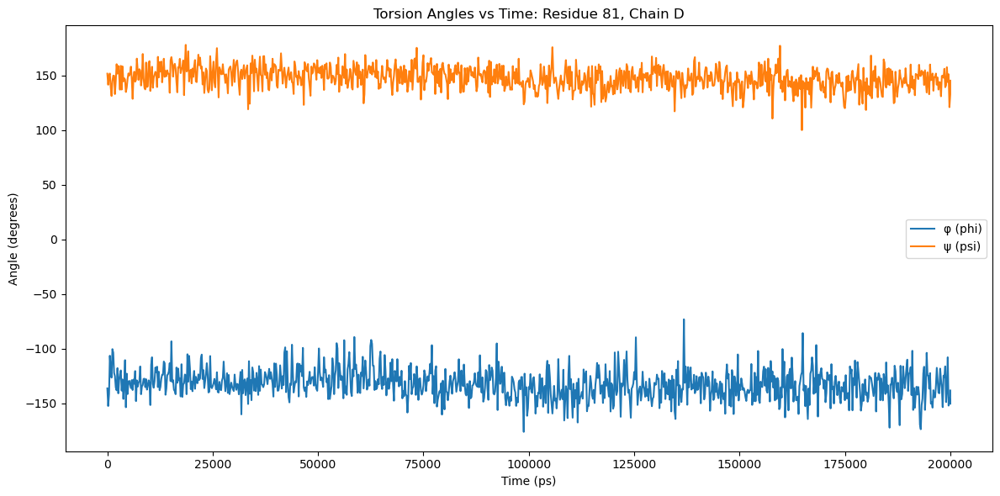

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_81_Chain_D.png


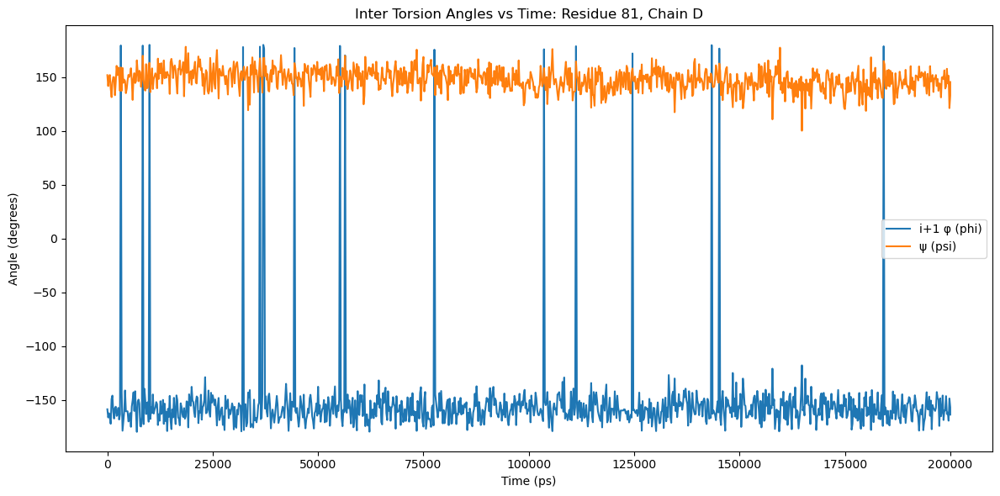

Plot saved as KcsA_torsion_vs_time_ChainD/Torsion_vs_Time_Residue_82_Chain_D.png


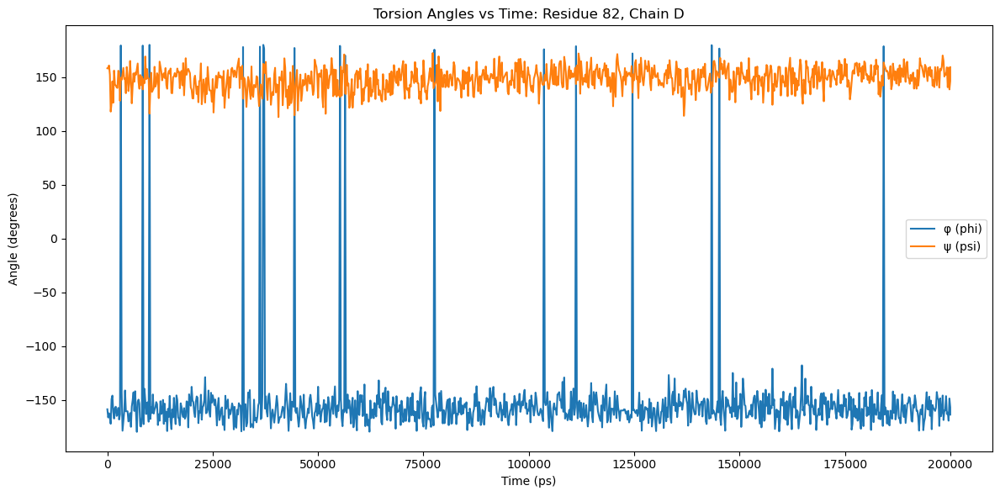

Plot saved as KcsA_inter_torsion_vs_time_ChainD/Inter_Torsion_vs_Time_Residue_82_Chain_D.png


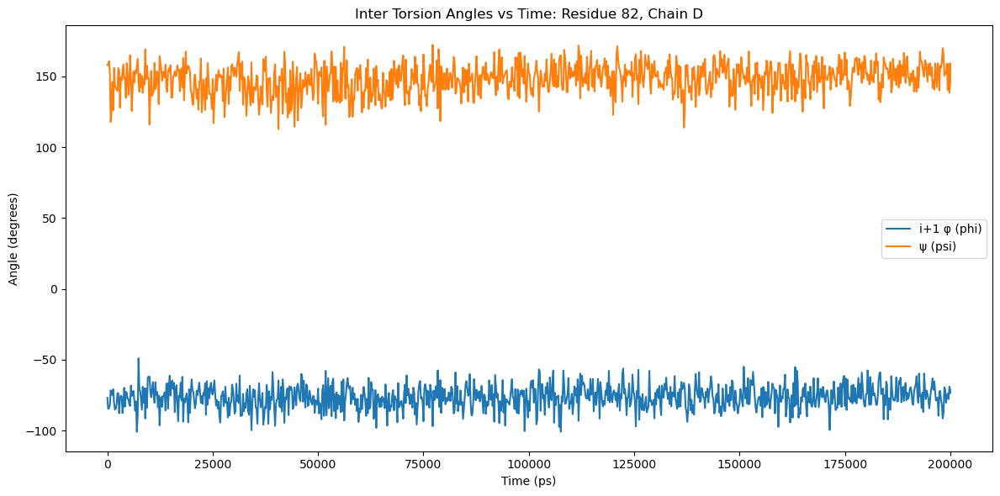

In [36]:
residues_to_plot=[52, 54, 76, 77, 78, 79, 80,81, 82]
#residues_to_plot=[23, 42, 55,61, 65, 97, 131, 146]
for residue in residues_to_plot:
    plot_torsion_vs_time(residue=residue, chain='D', analyzer=KcsA_analyzer[3], output_dir='KcsA_torsion_vs_time_ChainD')
    plot_inter_torsion_vs_time(residue=residue, chain='D', analyzer=KcsA_analyzer[3], output_dir='KcsA_inter_torsion_vs_time_ChainD')